In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.manifold import TSNE

#pre-processing
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# model evaluation
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix

# K-Means
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from scipy.spatial.distance import cdist
from matplotlib.patches import Ellipse

# random forest
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

# KNN
from sklearn.neighbors import KNeighborsClassifier

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

import warnings
warnings.filterwarnings('ignore')

# decision tree
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

# model building
from sklearn.model_selection import train_test_split, GridSearchCV

# model evaluation
from sklearn.metrics import accuracy_score, mean_squared_error

# gradient boosting
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

# set seed for reproducible results
RSEED = 10


# Section A

<div style= "font-size:18px;"> <b>Import the data: </b></div>
<div style="direction:rtl; font-size:15px;">  בחלק זה אנו מציגים את המידע שיש בכל אחד מהמסדי הנתונים ומדפיסים מידע אודותיהם</div>

In [2]:
df_country_complete = pd.read_csv('GeneralDemographicData/county_complete.csv')
df_president = pd.read_csv('USElectionResults19762020/1976-2020-president.csv')
df_house = pd.read_csv('USElectionResults19762020/1976-2020-house.csv')
df_senate = pd.read_csv('USElectionResults19762020/1976-2020-senate.csv')
df_Life_Expectancy = pd.read_csv('LifeExpectancyData/IHME_USA_LIFE_EXPECTANCY_1987_2007_Y2011M06D16.csv')
df_Economic = pd.read_csv('EconomicData/BCB-UDJIAD1.csv')
df_county_data_landarea = pd.read_csv('CountyData/5296US_landarea.csv')
df_county_data_pop = pd.read_csv('CountyData/5296US_pop.csv')
df_county_data_waterarea = pd.read_csv('CountyData/5296US_waterarea.csv')
df_Life_Expectancy_xlsx = pd.read_excel('LifeExpectancyData/IHME_USA_LIFE_EXPECTANCY_1987_2007_Y2011M06D16.xlsx') 

# Visualization

### This visualization show the number of candidate votes in every year :

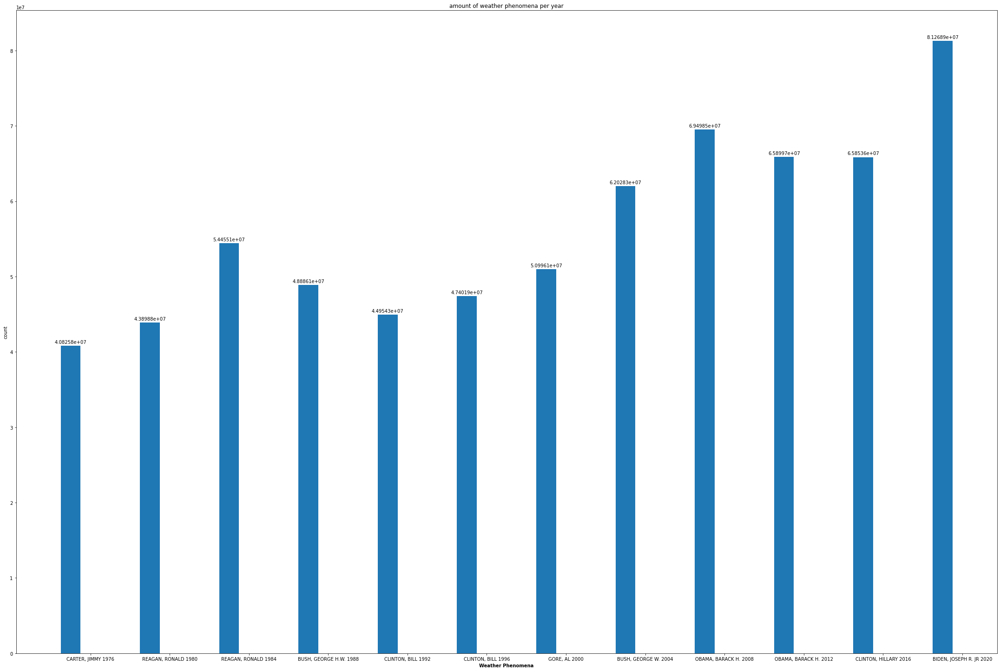

In [229]:
grouped_year_candidate = df_president.groupby(by=['year','candidate'],as_index=False).sum()
grouped_year_candidate = grouped_year_candidate[['year','candidate','candidatevotes']]

grouped_year_candidate_max = grouped_year_candidate.groupby(by='year').max()
max_list= grouped_year_candidate_max['candidatevotes'].values
max_list
year_list = set(grouped_year_candidate['year'].values)
year_list = list(year_list)
year_list = sorted(year_list)
year_list # get list of year

most_vote_candidate_list = []
for i in range(len(max_list)):
    row = grouped_year_candidate[grouped_year_candidate['candidatevotes'] == max_list[i]]['candidate']
    most_vote_candidate_list.append(row.values[0]) #get candidate name with the max vote
    
for i in range(len(list(year_list))):    
    most_vote_candidate_list[i] += " "  + str(year_list[i]) #add the year
most_vote_candidate_list


x = np.arange(len(most_vote_candidate_list))  # the label locations
width = 0.25  # the width of the bars

r1 = np.arange(len(most_vote_candidate_list))
fig, ax = plt.subplots(figsize=(30,20))
rects1 = ax.bar(r1, max_list, width)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('count')
ax.set_title('amount of weather phenomena per year')

ax.bar_label(rects1, padding=3)

fig.tight_layout()

plt.xlabel('Weather Phenomena', fontweight='bold')
plt.xticks([r + width for r in range(len(most_vote_candidate_list))], most_vote_candidate_list)
plt.show()

### This visualization show the distribution of certain features in some states:

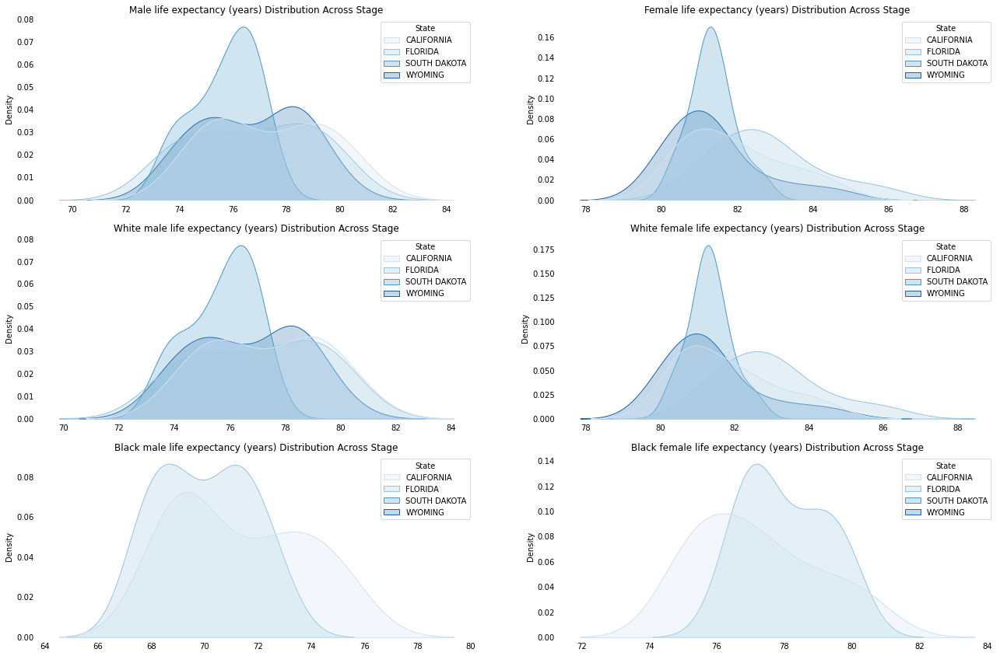

In [79]:
df_Life_Expectancy_grouped = df_Life_Expectancy.groupby(by=['State','Year'],as_index=False).max()
df_Life_Expectancy_grouped

df = df_Life_Expectancy_grouped[df_Life_Expectancy_grouped['State'].isin(['WYOMING','CALIFORNIA','FLORIDA','SOUTH DAKOTA'])] # only show 5 station for example
plt.figure(figsize=(22, 25))
numeric_features = df[["Male life expectancy (years)", "Female life expectancy (years)","White male life expectancy (years)","White female life expectancy (years)","Black male life expectancy (years)","Black female life expectancy (years)"]]

for i in numeric_features:
    plt.subplot(5, 2, numeric_features.columns.get_loc(i)+1)
    sns.kdeplot(df[i], hue=df['State'], fill=True, palette='Blues', common_norm=True,warn_singular=False)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.title(i + ' Distribution Across Stage')

### This visualiztion show the U.S. population distribution in 1990:

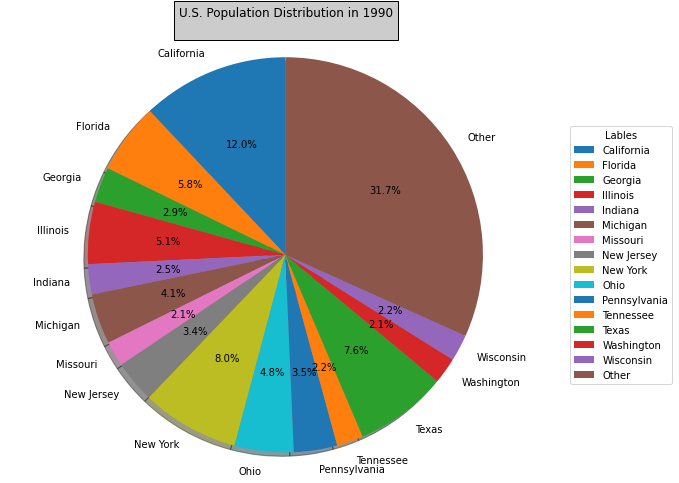

In [80]:
df = df_county_data.groupby(by=['State','Date'],as_index=False).sum()

state_list = []
population_list = []
total_pop = sum(df['Population'].values.tolist())
other_pop = 0 
for state, population in zip(df['State'].values.tolist(),df['Population'].values.tolist()):
    if((population *100 / total_pop) > 2):
        state_list.append(state)
        population_list.append(population)
    else:
        other_pop += population
        
state_list.append('Other')
population_list.append(other_pop)

labels = state_list

fig1, ax1 = plt.subplots(figsize=(10,8))
ax1.pie(population_list, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax1.legend(labels,
          title="Lables",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))
plt.title("U.S. Population Distribution in 1990\n", bbox={'facecolor':'0.8', 'pad':5})
plt.show()

### This visualization show the rate of increase in the popularity of some states each year:

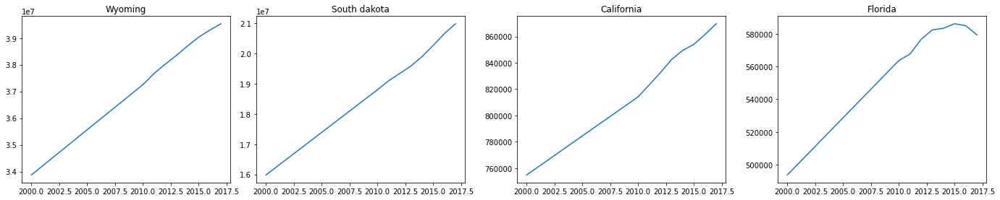

In [205]:

from matplotlib.figure import Figure

df = df_country_complete.groupby(by=['state'],as_index=False).sum()
df = df[['state','pop2000','pop2010','pop2011','pop2012','pop2013','pop2014','pop2015','pop2016','pop2017']]
df = df[df['state'].isin(['Wyoming','South Dakota','California','Florida'])] # only show 4 station for example

years = [2000,2010,2011,2012,2013,2014,2015,2016,2017]
list_pop =[]
for row in df.itertuples():
    list_pop.append([row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],row[10]])


fig = plt.figure(figsize =(5, 4))
 
# Creating first axes for the figure
ax1 = fig.add_axes([0.1, 0.1, 0.8, 0.8],title = 'Wyoming')

ax2 = fig.add_axes([1, 0.1, 0.8, 0.8],title = 'South dakota')

ax3 = fig.add_axes([2, 0.1, 0.8, 0.8],title ='California')

ax4 = fig.add_axes([3, 0.1, 0.8, 0.8],title ='Florida')


y=years
# Adding the data to be plotted
ax1.plot(y, list_pop[0])
ax2.plot(y, list_pop[1])
ax3.plot(y, list_pop[2])
ax4.plot(y, list_pop[3])

plt.show()

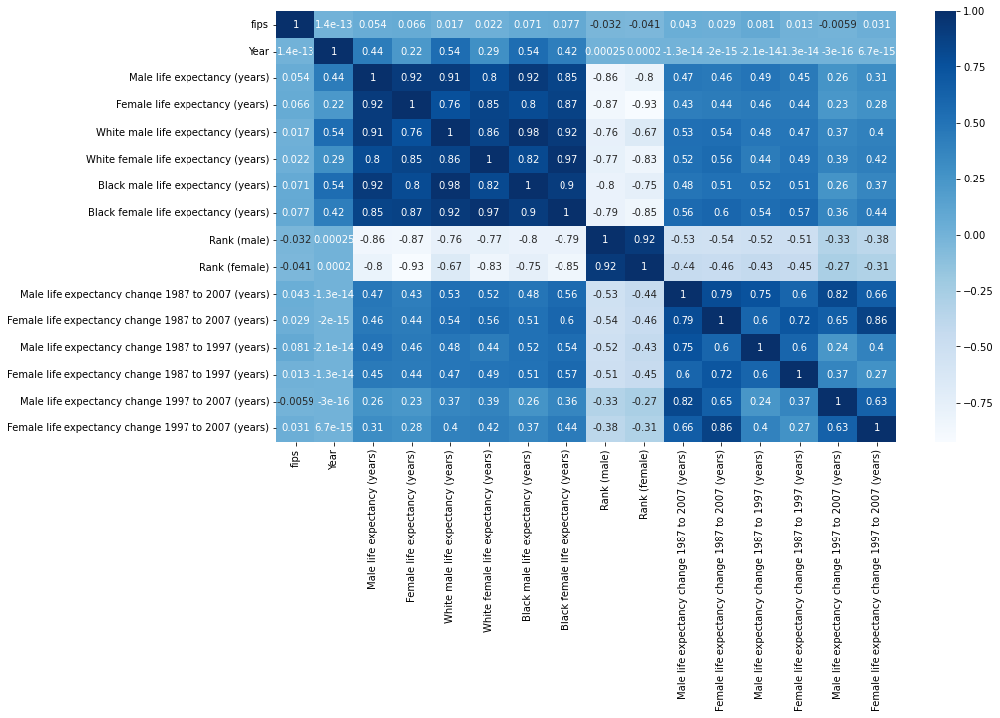

In [40]:
#create heatmap for the features
plt.figure(figsize=(14, 8))
sns.heatmap(df_Life_Expectancy_xlsx.corr(), annot=True, cmap='Blues')
plt.show()

In [41]:
plt.figure(figsize=(200, 100))
sns.heatmap(df_country_complete.corr(), annot=True, cmap='Blues')
plt.show()

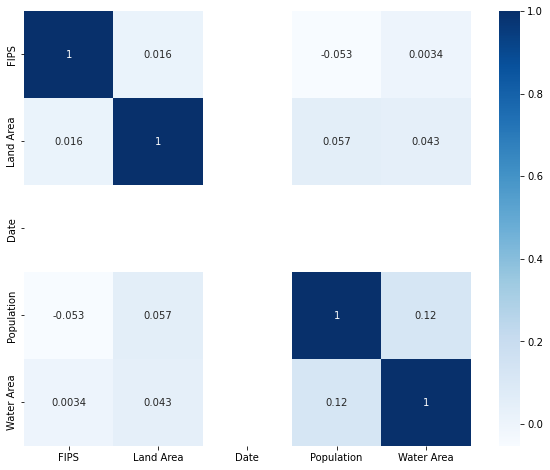

In [42]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_county_data.corr(), annot=True, cmap='Blues')
plt.show()

### This visualiztion show the difference between the annual average of the number of voters and the average each year:

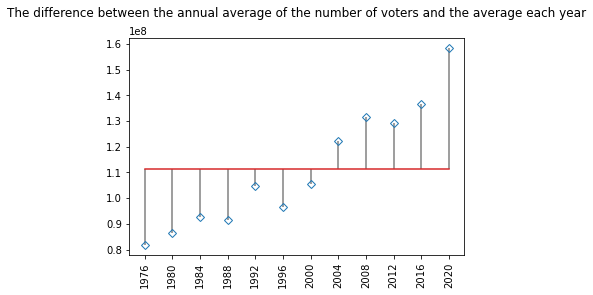

In [53]:
import statistics

df_filtered = df_president[["year","candidatevotes"]]

candidatevotes_list = []
candidatevotes_list = df_president['candidatevotes'].to_list()


grouped_year = df_filtered.groupby(df_filtered['year']).sum()
grouped_year=grouped_year["candidatevotes"].tolist()

grouped = df_filtered.groupby([df_filtered['year']])
grouped = grouped['candidatevotes']
labels=['1976', '1980', '1984', '1988', '1992', '1996', '2000','2004', '2008', '2012', '2016', '2020']

y = grouped_year[0:12]
x = np.linspace(0, 12, 12)
plt.xticks(x, labels, rotation='vertical')


markerline, stemlines, baseline = plt.stem(x,y, linefmt='grey', markerfmt='D',bottom=sum(grouped_year) / len(grouped_year))
markerline.set_markerfacecolor('none')
plt.title('The difference between the annual average of the number of voters and the average each year\n')
plt.show()


## Pre Processing 

In [39]:
df_Life_Expectancy_xlsx.isnull().sum()

fips                                                                0
State                                                               0
County                                                              0
Year                                                                0
Male life expectancy (years)                                        0
Years behind international frontier (male)                          0
Female life expectancy (years)                                      0
Years behind international frontier (female)                        0
White male life expectancy (years)                                  0
White female life expectancy (years)                                0
Black male life expectancy (years)                              50593
Black female life expectancy (years)                            47725
Closest ranked countries for male life expectancy (higher)         96
Closest ranked countries for female life expectancy (higher)       11
Closest ranked count

In [40]:
df_county_data_landarea.isnull().sum()

FIPS         0
State        0
County       0
Land Area    0
dtype: int64

<div style="direction:rtl; font-size:15px;">השתמשנו בטבלה df_country_data שהיא שילוב של שלוש טבלאות שבניהן נמצאת גם landarea שעשינן להן Inner Join</div>

In [41]:
df_county_data.isnull().sum()

FIPS            0
State           0
County          0
Land Area       0
Date            0
Population      0
Water Area    183
dtype: int64

In [42]:
df_country_complete.isnull().sum()

fips                       0
state                      0
name                       0
pop2000                    3
pop2010                    0
                          ..
uninsured_under_19_2019    0
uninsured_under_6_2019     0
veterans_2019              0
white_2019                 0
white_not_hispanic_2019    0
Length: 188, dtype: int64

<div style="direction:rtl; font-size:15px;">- נעבוד עם עותק של הטבלאות על מנת לא להרוס את המקוריות</div>

In [43]:
df_Life_Expectancy_xlsx_copy = df_Life_Expectancy_xlsx.copy(deep=True)
df_country_complete_copy = df_country_complete.copy(deep=True)
df_county_data_landarea_copy = df_county_data_landarea.copy(deep=True)
df_county_data_copy = df_county_data.copy(deep=True)

<div style="direction:rtl; font-size:15px;">הורדת מימדים לפי:</div>

<div style="direction:rtl; font-size:15px;">- נמחק שורות שיש להן 50% עמודות חסרות</div>

In [44]:
df_Life_Expectancy_xlsx_copy.dropna(thresh=len(df_Life_Expectancy_xlsx_copy.columns.tolist())/2, axis=0, inplace=True) 
df_country_complete_copy.dropna(thresh=len(df_country_complete_copy.columns.tolist())/2, axis=0, inplace=True) 
df_county_data_landarea_copy.dropna(thresh=len(df_county_data_landarea_copy.columns.tolist())/2, axis=0, inplace=True) 
df_county_data_copy.dropna(thresh=len(df_county_data_copy.columns.tolist())/2, axis=0, inplace=True)

# מחיקת עמודות שיותר מ-50% מהשורות לא מכילות מידע - 56000 מתוך 66000 
df_Life_Expectancy_xlsx_copy.drop(['Black male life expectancy (years)','Black female life expectancy (years)'], axis=1, inplace=True)

<div style="font-size:15px;">One-Hot Encoding for State column</div>

In [45]:
state_life_exp = [state.capitalize() for state in set(df_Life_Expectancy_xlsx_copy['State'].tolist())]
state_country_complete = [state.capitalize() for state in set(df_country_complete_copy['state'].tolist())]
state_data_landarea = [state.capitalize() for state in set(df_county_data_landarea_copy['State'].tolist())]
state_county_data = [state.capitalize() for state in set(df_county_data_copy['State'].tolist())]

states_df_1 = pd.DataFrame(columns = state_life_exp)
states_df_2 = pd.DataFrame(columns = state_country_complete)
states_df_3 = pd.DataFrame(columns = state_data_landarea)
states_df_4 = pd.DataFrame(columns = state_county_data)

df_Life_Expectancy_xlsx_copy = pd.concat([df_Life_Expectancy_xlsx_copy, states_df_1], axis=1)
df_country_complete_copy = pd.concat([df_country_complete_copy, states_df_2], axis=1)
df_county_data_landarea_copy = pd.concat([df_county_data_landarea_copy, states_df_3], axis=1)
df_county_data_copy = pd.concat([df_county_data_copy, states_df_4], axis=1)

#fill the columns

for row in df_Life_Expectancy_xlsx_copy.itertuples(): # put 1 on the current store column
    df_Life_Expectancy_xlsx_copy.at[row[0],str(row[2].capitalize())]=1
for state in state_life_exp:
    df_Life_Expectancy_xlsx_copy[state.capitalize()].replace(np.NaN, 0, inplace=True)
    
for row in df_country_complete_copy.itertuples(): # put 1 on the current store column
    df_country_complete_copy.at[row[0],str(row[2].capitalize())]=1
for state in state_country_complete:
    df_country_complete_copy[state.capitalize()].replace(np.NaN, 0, inplace=True)

    
for row in df_county_data_landarea_copy.itertuples(): # put 1 on the current store column
    df_county_data_landarea_copy.at[row[0],str(row[2].capitalize())]=1
for state in state_data_landarea:
    df_county_data_landarea_copy[state.capitalize()].replace(np.NaN, 0, inplace=True)

    
for row in df_county_data_copy.itertuples(): # put 1 on the current store column
    df_county_data_copy.at[row[0],str(row[2].capitalize())]=1
for state in state_county_data:
    df_county_data_copy[state.capitalize()].replace(np.NaN, 0, inplace=True)

In [46]:
# Mapping according to the five countries we were asked to reduce the size of the table

df_Life_Expectancy_xlsx_copy = df_Life_Expectancy_xlsx_copy[(df_Life_Expectancy_xlsx_copy['California']==1) | 
                                                            (df_Life_Expectancy_xlsx_copy['Florida']==1) |
                                                             (df_Life_Expectancy_xlsx_copy['South dakota']==1) |
                                                             (df_Life_Expectancy_xlsx_copy['Wyoming']==1)]

df_country_complete_copy = df_country_complete_copy[(df_country_complete_copy['California']==1 ) | 
                                                            (df_country_complete_copy['Florida']==1) |
                                                             (df_country_complete_copy['South dakota']==1) |
                                                             (df_country_complete_copy['Wyoming']==1)]

df_county_data_landarea_copy = df_county_data_landarea_copy[(df_county_data_landarea_copy['California']==1 ) | 
                                                            (df_county_data_landarea_copy['Florida']==1) |
                                                             (df_county_data_landarea_copy['South dakota']==1) |
                                                             (df_county_data_landarea_copy['Wyoming']==1)]

df_county_data_copy = df_county_data_copy[(df_county_data_copy['California']==1 ) | 
                                                            (df_county_data_copy['Florida']==1) |
                                                             (df_county_data_copy['South dakota']==1) |
                                                             (df_county_data_copy['Wyoming']==1)]

Throw away all the state columns we don't need

In [47]:
states = ['California','Florida','South dakota','Wyoming']
for i in states:
    state_life_exp.remove(i)
    state_country_complete.remove(i)
    state_data_landarea.remove(i)
    state_county_data.remove(i)
    
df_Life_Expectancy_xlsx_copy.drop(state_life_exp, axis=1, inplace=True)
df_country_complete_copy.drop(state_country_complete, axis=1, inplace=True)
df_county_data_landarea_copy.drop(state_data_landarea, axis=1, inplace=True)
df_county_data_copy.drop(state_county_data, axis=1, inplace=True)

<div style="font-size:17px;">One-Hot Encoding for County column</div>

We will remove the word County from the records in the County column and add it to a new column named Name

In [105]:
Countys_list = df_country_complete_copy['name'].tolist()
for i in range(len(Countys_list)):
    if('County' in Countys_list[i]):
        Countys_list[i] = Countys_list[i][:len(Countys_list[i])-7]
df_country_complete_copy['County'] = Countys_list

In [106]:
County_life_exp = [county.capitalize() for county in set(df_Life_Expectancy_xlsx_copy['County'].tolist())]
County_country_complete = [county.capitalize() for county in set(df_country_complete_copy['County'].tolist())]
County_data_landarea = [county.capitalize() for county in set(df_county_data_landarea_copy['County'].tolist())]
County_county_data = [county.capitalize() for county in set(df_county_data_copy['County'].tolist())]

County_df_1 = pd.DataFrame(columns = County_life_exp)
County_df_2 = pd.DataFrame(columns = County_country_complete)
County_df_3 = pd.DataFrame(columns = County_data_landarea)
County_df_4 = pd.DataFrame(columns = County_county_data)

df_Life_Expectancy_xlsx_copy = pd.concat([df_Life_Expectancy_xlsx_copy, County_df_1], axis=1)
df_country_complete_copy = pd.concat([df_country_complete_copy, County_df_2], axis=1)
df_county_data_landarea_copy = pd.concat([df_county_data_landarea_copy, County_df_3], axis=1)
df_county_data_copy = pd.concat([df_county_data_copy, County_df_4], axis=1)

#fill the columns

for row in df_Life_Expectancy_xlsx_copy.itertuples(): # put 1 on the current store column
    df_Life_Expectancy_xlsx_copy.at[row[0],str(row[3]).capitalize()]=1
for County in County_life_exp:
    df_Life_Expectancy_xlsx_copy[County].replace(np.NaN, 0, inplace=True)
    
for row in df_country_complete_copy.itertuples(): # put 1 on the current store column
    df_country_complete_copy.at[row[0],str(row[240]).capitalize()]=1
for County in County_country_complete:
    df_country_complete_copy[County].replace(np.NaN, 0, inplace=True)

    
for row in df_county_data_landarea_copy.itertuples(): # put 1 on the current store column
    df_county_data_landarea_copy.at[row[0],str(row[3]).capitalize()]=1
for County in County_data_landarea:
    df_county_data_landarea_copy[County].replace(np.NaN, 0, inplace=True)

    
for row in df_county_data_copy.itertuples(): # put 1 on the current store column
    df_county_data_copy.at[row[0],str(row[3]).capitalize()]=1
for County in County_county_data:
    df_county_data_copy[County].replace(np.NaN, 0, inplace=True)

In [107]:
# We drop County and name columns because they not necessary at this moment

df_Life_Expectancy_xlsx_copy.drop(['State','County'], axis=1, inplace=True)
df_country_complete_copy.drop(['state','name','County'], axis=1, inplace=True)
df_county_data_landarea_copy.drop(['State','County'], axis=1, inplace=True)
df_county_data_copy.drop(['State','County'], axis=1, inplace=True)

<div style="direction:rtl; font-size:15px;">יש לנו בעמודות Years behing international frontier מחרוזת שמייצגת 50+, נשנה את ערכה ל-100 ונחליט ש-100 מייצג 50+ כשדה מספרי</div>

In [108]:
# we got 50+ string on this colums, so now 100 means 50+
df_Life_Expectancy_xlsx_copy['Years behind international frontier (male)'].replace('50+', 100, inplace=True)
df_Life_Expectancy_xlsx_copy['Years behind international frontier (female)'].replace('50+', 100, inplace=True)

df_Life_Expectancy_xlsx_copy['Years behind international frontier (male)'] = pd.to_numeric(df_Life_Expectancy_xlsx_copy['Years behind international frontier (male)'],downcast='float')
df_Life_Expectancy_xlsx_copy['Years behind international frontier (female)'] = pd.to_numeric(df_Life_Expectancy_xlsx_copy['Years behind international frontier (female)'],downcast='float')

<div style="direction:rtl; font-size:15px;">נמחק עמודות שלא רלוונטיות</div>

In [109]:
df_Life_Expectancy_xlsx_copy.drop(['Closest ranked countries for male life expectancy (lower)','Closest ranked countries for female life expectancy (higher)','Closest ranked countries for male life expectancy (lower)','Closest ranked countries for female life expectancy (lower)','Closest ranked countries for male life expectancy (higher)'], axis=1, inplace=True)

We fill the empty place with KNN algorithm

In [110]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_Life_Expectancy_xlsx_copy)

# replace values in the dataset with new imputed values
df_Life_Expectancy_xlsx_copy[df_Life_Expectancy_xlsx_copy.columns] = imputed
df_Life_Expectancy_xlsx_copy.isna().sum()

fips                                          0
Year                                          0
Male life expectancy (years)                  0
Years behind international frontier (male)    0
Female life expectancy (years)                0
                                             ..
Contra costa                                  0
Putnam                                        0
Calhoun                                       0
Campbell                                      0
Alameda                                       0
Length: 225, dtype: int64

In [111]:
df_country_complete_copy.replace({'none':None}, inplace=True)
df_country_complete_copy.replace({'NA':None}, inplace=True)
# קיימים שם איברים עם '-' במקום ריק
df_country_complete_copy['uninsured_age_under_6_2017'].replace('-', None, inplace=True)

df_country_complete_copy.drop(['smoking_ban_2010'], axis=1, inplace=True)

In [112]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_country_complete_copy)

# replace values in the dataset with new imputed values
df_country_complete_copy[df_country_complete_copy.columns] = imputed
df_country_complete_copy.isna().sum()

fips         0
pop2000      0
pop2010      0
pop2011      0
pop2012      0
            ..
Platte       0
El dorado    0
Hanson       0
Trinity      0
Nan          0
Length: 395, dtype: int64

In [113]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_county_data_landarea_copy)

# replace values in the dataset with new imputed values
df_county_data_landarea_copy[df_county_data_landarea_copy.columns] = imputed
df_county_data_landarea_copy.isna().sum()

FIPS            0
Land Area       0
Florida         0
California      0
South dakota    0
               ..
Minnehaha       0
Platte          0
El dorado       0
Hanson          0
Trinity         0
Length: 211, dtype: int64

In [114]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_county_data_copy)

# replace values in the dataset with new imputed values
df_county_data_copy[df_county_data_copy.columns] = imputed
df_county_data_copy.isna().sum()

FIPS          0
Land Area     0
Date          0
Population    0
Water Area    0
             ..
Minnehaha     0
Platte        0
El dorado     0
Hanson        0
Trinity       0
Length: 206, dtype: int64

# Section B

### Section B.1

Algorithms used for dimension reduction are : Missing Value Ratio,  High Correlation Filter (in section A)
<br>
And later we realized as well PCA

https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/

In [48]:
df_Life_Expectancy_xlsx_copy.drop(['Female life expectancy (years)','White male life expectancy (years)','Rank (female)'], axis=1, inplace=True)
list_to_remove= ['pop2000','pop2010','pop2011','pop2012','pop2013','pop2014','pop2015','pop2016',
                              'veterans_2010','housing_units_2010','households_2010','households_2017','sales_2007','civilian_labor_force_2007',
                              'civilian_labor_force_2008','civilian_labor_force_2009','employed_2007','employed_2008','employed_2009',
                              'unemployed_2007','unemployed_2008','unemployed_2009','civilian_labor_force_2010','employed_2010','unemployed_2010',
                              'civilian_labor_force_2011','employed_2011','unemployed_2011','civilian_labor_force_2012','employed_2012','unemployed_2012'
                              ,'civilian_labor_force_2013','employed_2013','unemployed_2013','civilian_labor_force_2014','employed_2014','unemployed_2014',
                              'civilian_labor_force_2015','employed_2015','unemployed_2015','civilian_labor_force_2016','employed_2016','unemployed_2016',
                              'civilian_labor_force_2017','employed_2017','unemployed_2017','age_over_65_2010','age_over_65_2017','white_2010',
                              'pop_2019','median_age_2017']


df_country_complete_copy.drop(list_to_remove, axis=1, inplace=True)


In [49]:
df_county_data_landarea_copy
list_of_county = df_county_data_landarea_copy.columns[2:] # כדי למנוע כפילויות בעמודות
df_county_data_landarea_copy.drop(list_of_county, axis=1, inplace=True)
df_county_data_landarea_copy

,FIPS,State
157,6001,California
158,6003,California
159,6005,California
160,6007,California
161,6009,California
...,...,...
3106,56037,Wyoming
3107,56039,Wyoming
3108,56041,Wyoming
3109,56043,Wyoming


In [50]:
df_country_complete_copy.rename(columns = {'fips':'FIPS'}, inplace = True)
list_of_county = df_country_complete_copy.columns[134:] # כדי למנוע כפילויות בעמודות
df_country_complete_copy.drop(list_of_county, axis=1, inplace=True)
df_country_complete_copy

,FIPS,state,name,pop2017,age_under_5_2010,age_under_5_2017,age_under_18_2010,female_2010,black_2010,black_2017,...,persons_per_household_2019,poverty_2019,poverty_65_and_over_2019,poverty_under_18_2019,two_plus_races_2019,unemployment_rate_2019,uninsured_2019,uninsured_65_and_older_2019,uninsured_under_19_2019,uninsured_under_6_2019
186,6001,California,Alameda County,1663190.0,6.5,6.0,22.6,51.0,12.6,5.54,...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
187,6003,California,Alpine County,1120.0,6.0,1.9,21.8,48.4,0.0,0.75,...,2.87,NaN,NaN,NaN,5.1,15.6,8.9,0.0,3.7,0.0
188,6005,California,Amador County,38626.0,3.8,3.9,16.8,45.5,2.5,1.07,...,2.38,NaN,NaN,NaN,4.8,6.6,4.7,0.0,3.4,5.1
189,6007,California,Butte County,229294.0,5.6,5.5,21.0,50.5,1.6,0.75,...,2.57,19.1,9.7,19.6,6.1,7.7,6.2,0.3,3.2,3.3
190,6009,California,Calaveras County,45670.0,4.4,4.2,19.6,49.9,0.8,0.29,...,2.66,NaN,NaN,NaN,5.2,6.6,4.4,0.1,0.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,Sweetwater County,43534.0,8.4,7.2,27.1,47.8,1.0,0.41,...,2.77,NaN,NaN,NaN,2.3,5.7,11.3,0.5,9.2,13.8
3138,56039,Wyoming,Teton County,23265.0,6.0,5.3,19.1,47.4,0.2,0.32,...,2.47,NaN,NaN,NaN,0.7,0.7,12.7,0.0,10.1,5.9
3139,56041,Wyoming,Uinta County,20495.0,8.4,7.5,30.2,49.5,0.3,0.07,...,2.66,NaN,NaN,NaN,3.5,5.5,11.2,0.6,6.8,1.8
3140,56043,Wyoming,Washakie County,8064.0,7.0,5.5,25.5,50.1,0.3,0.15,...,2.34,NaN,NaN,NaN,3.8,4.1,15.0,1.5,7.0,7.8


In [51]:
df_Life_Expectancy_xlsx_copy.rename(columns = {'fips':'FIPS'}, inplace = True)
df_Life_Expectancy_xlsx_copy

,FIPS,State,County,Year,Male life expectancy (years),Years behind international frontier (male),Years behind international frontier (female),White female life expectancy (years),Closest ranked countries for male life expectancy (higher),Closest ranked countries for female life expectancy (higher),...,Male life expectancy change 1987 to 2007 (years),Female life expectancy change 1987 to 2007 (years),Male life expectancy change 1987 to 1997 (years),Female life expectancy change 1987 to 1997 (years),Male life expectancy change 1997 to 2007 (years),Female life expectancy change 1997 to 2007 (years),Wyoming,California,Florida,South dakota
3927,6001,CALIFORNIA,ALAMEDA,1987,71.6,12,10,78.6,"Belgium,Denmark,France,Martinique,United Kingdom","Channel Islands,Cyprus,Luxembourg,Martinique,U...",...,6.1,4.2,2.6,1.9,3.5,2.3,0,1,0,0
3928,6001,CALIFORNIA,ALAMEDA,1988,71.6,12,11,78.6,"Barbados,Brunei Darussalam,Germany,Ireland,New...","Austria,Channel Islands,Germany,Luxembourg,Uni...",...,6.1,4.2,2.6,1.9,3.5,2.3,0,1,0,0
3929,6001,CALIFORNIA,ALAMEDA,1989,71.5,14,11,78.8,"Austria,Barbados,Brunei Darussalam,Netherlands...","Austria,Germany,United Kingdom,United States,V...",...,6.1,4.2,2.6,1.9,3.5,2.3,0,1,0,0
3930,6001,CALIFORNIA,ALAMEDA,1990,71.9,13,12,79.0,"Austria,Barbados,Brunei Darussalam,Germany,Ire...","Austria,Germany,Guadeloupe,United Kingdom,Unit...",...,6.1,4.2,2.6,1.9,3.5,2.3,0,1,0,0
3931,6001,CALIFORNIA,ALAMEDA,1991,72.1,13,11,79.2,"Austria,Brunei Darussalam,Denmark,Germany,Ireland","Austria,Channel Islands,Cyprus,Germany,United ...",...,6.1,4.2,2.6,1.9,3.5,2.3,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66082,56045,WYOMING,WESTON,2003,75.0,12,14,80.5,"Belgium,Denmark,Guadeloupe,Luxembourg,Virgin I...","Costa Rica,Ireland,Slovenia,United Kingdom,Uni...",...,3.5,1.7,2.0,0.2,1.5,1.5,1,0,0,0
66083,56045,WYOMING,WESTON,2004,75.4,11,15,80.5,"Belgium,Cuba,Kuwait,Luxembourg,Martinique","Costa Rica,Greece,Ireland,Slovenia,United States",...,3.5,1.7,2.0,0.2,1.5,1.5,1,0,0,0
66084,56045,WYOMING,WESTON,2005,75.4,12,15,80.7,"Denmark,Finland,Guadeloupe,Kuwait,Virgin Islan...","Channel Islands,Costa Rica,Greece,Malta,United...",...,3.5,1.7,2.0,0.2,1.5,1.5,1,0,0,0
66085,56045,WYOMING,WESTON,2006,75.6,12,14,81.1,"Denmark,Finland,Guadeloupe,Kuwait,Virgin Islan...","Channel Islands,Costa Rica,Malta,United Kingdo...",...,3.5,1.7,2.0,0.2,1.5,1.5,1,0,0,0


In [52]:
result= pd.merge(left = df_Life_Expectancy_xlsx_copy, right = df_county_data_landarea_copy, how = 'inner' , on = ['FIPS'])
df_section_B=pd.merge(left = result, right = df_country_complete_copy, how = 'inner' , on = ['FIPS'])
list_of_county = df_section_B.columns[13:222] # כדי למנוע כפילויות בעמודות
df_section_B

,FIPS,State_x,County,Year,Male life expectancy (years),Years behind international frontier (male),Years behind international frontier (female),White female life expectancy (years),Closest ranked countries for male life expectancy (higher),Closest ranked countries for female life expectancy (higher),...,persons_per_household_2019,poverty_2019,poverty_65_and_over_2019,poverty_under_18_2019,two_plus_races_2019,unemployment_rate_2019,uninsured_2019,uninsured_65_and_older_2019,uninsured_under_19_2019,uninsured_under_6_2019
0,6001,CALIFORNIA,ALAMEDA,1987,71.6,12,10,78.6,"Belgium,Denmark,France,Martinique,United Kingdom","Channel Islands,Cyprus,Luxembourg,Martinique,U...",...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
1,6001,CALIFORNIA,ALAMEDA,1988,71.6,12,11,78.6,"Barbados,Brunei Darussalam,Germany,Ireland,New...","Austria,Channel Islands,Germany,Luxembourg,Uni...",...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
2,6001,CALIFORNIA,ALAMEDA,1989,71.5,14,11,78.8,"Austria,Barbados,Brunei Darussalam,Netherlands...","Austria,Germany,United Kingdom,United States,V...",...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
3,6001,CALIFORNIA,ALAMEDA,1990,71.9,13,12,79.0,"Austria,Barbados,Brunei Darussalam,Germany,Ire...","Austria,Germany,Guadeloupe,United Kingdom,Unit...",...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
4,6001,CALIFORNIA,ALAMEDA,1991,72.1,13,11,79.2,"Austria,Brunei Darussalam,Denmark,Germany,Ireland","Austria,Channel Islands,Cyprus,Germany,United ...",...,2.82,9.9,9.5,11.3,6.5,4.4,4.4,1.0,2.1,1.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4447,56045,WYOMING,WESTON,2003,75.0,12,14,80.5,"Belgium,Denmark,Guadeloupe,Luxembourg,Virgin I...","Costa Rica,Ireland,Slovenia,United Kingdom,Uni...",...,2.32,NaN,NaN,NaN,1.3,4.0,11.8,0.0,8.6,7.1
4448,56045,WYOMING,WESTON,2004,75.4,11,15,80.5,"Belgium,Cuba,Kuwait,Luxembourg,Martinique","Costa Rica,Greece,Ireland,Slovenia,United States",...,2.32,NaN,NaN,NaN,1.3,4.0,11.8,0.0,8.6,7.1
4449,56045,WYOMING,WESTON,2005,75.4,12,15,80.7,"Denmark,Finland,Guadeloupe,Kuwait,Virgin Islan...","Channel Islands,Costa Rica,Greece,Malta,United...",...,2.32,NaN,NaN,NaN,1.3,4.0,11.8,0.0,8.6,7.1
4450,56045,WYOMING,WESTON,2006,75.6,12,14,81.1,"Denmark,Finland,Guadeloupe,Kuwait,Virgin Islan...","Channel Islands,Costa Rica,Malta,United Kingdo...",...,2.32,NaN,NaN,NaN,1.3,4.0,11.8,0.0,8.6,7.1


In [53]:
filtered_Wyoming = pd.DataFrame()
filtered_California = pd.DataFrame()
filtered_Florida = pd.DataFrame()
filtered_dakota = pd.DataFrame()

for row in df_section_B.itertuples():
    list_val= []
    for val in row:
        list_val.append(val)
    a_series = pd.Series(list_val[1:], index = df_section_B.columns)
    if(row[16] == 1):
        filtered_Wyoming = filtered_Wyoming.append(a_series, ignore_index=True)
    if(row[15] == 1):
        filtered_California = filtered_California.append(a_series, ignore_index=True)
    if(row[17] == 1):
        filtered_Florida = filtered_Florida.append(a_series, ignore_index=True)
    if(row[14] == 1):
        filtered_dakota = filtered_dakota.append(a_series, ignore_index=True)

In [54]:
filtered_dakota.drop(filtered_dakota.columns[13:222], axis=1, inplace=True)
filtered_California.drop(filtered_California.columns[13:222], axis=1, inplace=True)
filtered_Florida.drop(filtered_Florida.columns[13:222], axis=1, inplace=True)
filtered_Wyoming.drop(filtered_Wyoming.columns[13:222], axis=1, inplace=True)

### PCA algorithm

In [122]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(filtered_dakota)

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_dakota['target']='South Dakota'
finalDf1 = pd.concat([principalDf, filtered_dakota[['target']]], axis = 1)

In [123]:
principalComponents = pca.fit_transform(filtered_California)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_California['target']='California'
finalDf2 = pd.concat([principalDf, filtered_California[['target']]], axis = 1)

In [124]:
principalComponents = pca.fit_transform(filtered_Florida)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Florida['target']='Florida'
finalDf3 = pd.concat([principalDf, filtered_Florida[['target']]], axis = 1)

In [125]:
principalComponents = pca.fit_transform(filtered_Wyoming)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Wyoming['target']='Wyoming'
finalDf4 = pd.concat([principalDf, filtered_Wyoming[['target']]], axis = 1)

In [126]:
df = pd.concat([finalDf1, finalDf2,finalDf3,finalDf4], axis=0)
df

,principal component 1,principal component 2,target
0,-2.313563e+05,19563.443385,South Dakota
1,-2.313563e+05,19563.441495,South Dakota
2,-2.313563e+05,19563.430924,South Dakota
3,-2.313563e+05,19563.433000,South Dakota
4,-2.313563e+05,19563.401092,South Dakota
...,...,...,...
1213,-1.384589e+07,771410.471498,Wyoming
1214,-1.384589e+07,771410.471364,Wyoming
1215,-1.384589e+07,771410.471013,Wyoming
1216,-1.384589e+07,771410.471197,Wyoming


### Section B.2

https://towardsdatascience.com/pca-clearly-explained-how-when-why-to-use-it-and-feature-importance-a-guide-in-python-7c274582c37e

The importance of each feature is reflected by the magnitude of the corresponding values in the eigenvectors (higher magnitude — higher importance).

In [152]:
orginal_list_com1 = abs(pca.components_[0]).tolist() # Absolute
orginal_list_com1_sort = sorted(orginal_list_com1)


#The highest values are the most influential features, and are respectively in the table so we can according to the index pull them out
best_features_com1 = orginal_list_com1_sort[-11:] # Returns the top 10 from the end - because the array is sorted
worst_features_com1 = orginal_list_com1_sort[0:11] # top 10 from the start

index_value_com1 = []
worst_index_value_com1 = []

for val in best_features_com1: # get feature indexs
    index_value_com1.append(orginal_list_com1.index(val))

for val in worst_features_com1: # get feature indexs
    worst_index_value_com1.append(orginal_list_com1.index(val))
    
best_features_list = []
worst_features_list = [] 

for index in index_value_com1:
    best_features_list.append(filtered_dakota.columns[index])

for index in worst_index_value_com1:
    worst_features_list.append(filtered_dakota.columns[index])
    
print("The best feautres are:\n")
print(*best_features_list, sep = "\n")

print("\nThe worst feautres are:\n")
print(*worst_features_list, sep = "\n")

The best feautres are:

sales_per_capita_2007
firms_2007
median_household_income_2016
households_2019
private_nonfarm_employment_2009
median_val_owner_occupied_2010
pop2017
accommodation_food_service_2007
fed_spending_2009
mercent_whole_sales_2007
manufacturer_shipments_2007

The worst feautres are:

Year
pac_isl_2019
pac_isl_owned_firms_2007
pac_isl_2017
pac_isl_2010
asian_owned_firms_2007
age_under_5_2017
two_plus_races_2017
veterans_2019
avg_family_size_2019
persons_per_household_2017


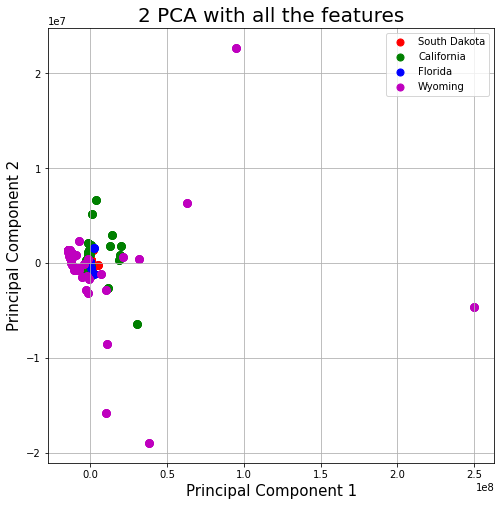

In [127]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 PCA with all the features', fontsize = 20)
targets = ['South Dakota', 'California', 'Florida','Wyoming']
colors = ['r', 'g', 'b','m']
for target, color in zip(targets,colors):
    indicesToKeep = df['target'] == target
    ax.scatter(df.loc[indicesToKeep, 'principal component 1']
               , df.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<div style="direction:rtl; font-size:15px;"> נציב רק את הפיצרים <b> החשובים </b> ונציג את הפיזור:</div>
<div style="direction:rtl; font-size:15px;"> - נשים לב שהתרשים זהה לתרשים עם כלל הפיצרים מכיוון שאלו הפיצרים שהכי משפיעים על החלוקה ולכן התרשים זהה </div>

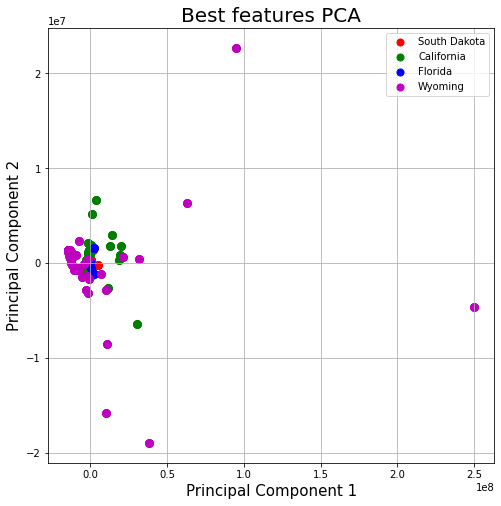

In [81]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(filtered_dakota[['sales_per_capita_2007',
'firms_2007',
'median_household_income_2016',
'households_2019',
'private_nonfarm_employment_2009',
'median_val_owner_occupied_2010',
'pop2017',
'accommodation_food_service_2007',
'fed_spending_2009',
'mercent_whole_sales_2007',
'manufacturer_shipments_2007']])

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_dakota['target']='South Dakota'
finalDf1 = pd.concat([principalDf, filtered_dakota[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_California[['sales_per_capita_2007',
'firms_2007',
'median_household_income_2016',
'households_2019',
'private_nonfarm_employment_2009',
'median_val_owner_occupied_2010',
'pop2017',
'accommodation_food_service_2007',
'fed_spending_2009',
'mercent_whole_sales_2007',
'manufacturer_shipments_2007']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_California['target']='California'
finalDf2 = pd.concat([principalDf, filtered_California[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_Florida[['sales_per_capita_2007',
'firms_2007',
'median_household_income_2016',
'households_2019',
'private_nonfarm_employment_2009',
'median_val_owner_occupied_2010',
'pop2017',
'accommodation_food_service_2007',
'fed_spending_2009',
'mercent_whole_sales_2007',
'manufacturer_shipments_2007']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Florida['target']='Florida'
finalDf3 = pd.concat([principalDf, filtered_Florida[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_Wyoming[['sales_per_capita_2007',
'firms_2007',
'median_household_income_2016',
'households_2019',
'private_nonfarm_employment_2009',
'median_val_owner_occupied_2010',
'pop2017',
'accommodation_food_service_2007',
'fed_spending_2009',
'mercent_whole_sales_2007',
'manufacturer_shipments_2007']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Wyoming['target']='Wyoming'
finalDf4 = pd.concat([principalDf, filtered_Wyoming[['target']]], axis = 1)

df = pd.concat([finalDf1, finalDf2,finalDf3,finalDf4], axis=0)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('Best features PCA', fontsize = 20)
targets = ['South Dakota', 'California', 'Florida','Wyoming']
colors = ['r', 'g', 'b','m']
for target, color in zip(targets,colors):
    indicesToKeep = df['target'] == target
    ax.scatter(df.loc[indicesToKeep, 'principal component 1']
               , df.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

<div style="direction:rtl; font-size:15px;"> נציב רק את הפיצרים <b> הגרועים </b> ונציג את הפיזור:</div>

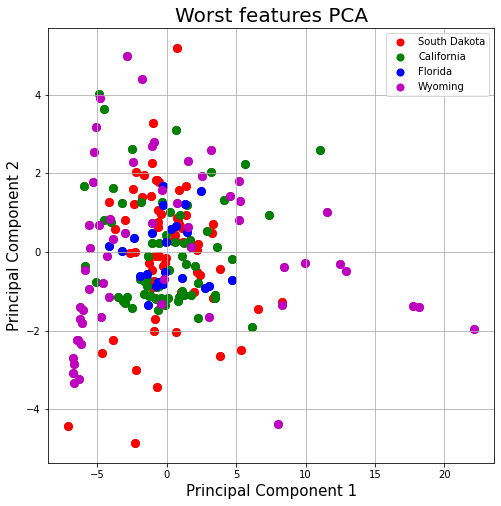

In [80]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(filtered_dakota[['pac_isl_2019','pac_isl_2019',
'pac_isl_owned_firms_2007',
'pac_isl_2017',
'pac_isl_2010',
'asian_owned_firms_2007',
'age_under_5_2017',
'two_plus_races_2017',
'veterans_2019',
'avg_family_size_2019',
'persons_per_household_2017']])

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_dakota['target']='South Dakota'
finalDf1 = pd.concat([principalDf, filtered_dakota[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_California[['pac_isl_2019','pac_isl_2019',
'pac_isl_owned_firms_2007',
'pac_isl_2017',
'pac_isl_2010',
'asian_owned_firms_2007',
'age_under_5_2017',
'two_plus_races_2017',
'veterans_2019',
'avg_family_size_2019',
'persons_per_household_2017']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_California['target']='California'
finalDf2 = pd.concat([principalDf, filtered_California[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_Florida[['pac_isl_2019','pac_isl_2019',
'pac_isl_owned_firms_2007',
'pac_isl_2017',
'pac_isl_2010',
'asian_owned_firms_2007',
'age_under_5_2017',
'two_plus_races_2017',
'veterans_2019',
'avg_family_size_2019',
'persons_per_household_2017']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Florida['target']='Florida'
finalDf3 = pd.concat([principalDf, filtered_Florida[['target']]], axis = 1)

principalComponents = pca.fit_transform(filtered_Wyoming[['pac_isl_2019','pac_isl_2019',
'pac_isl_owned_firms_2007',
'pac_isl_2017',
'pac_isl_2010',
'asian_owned_firms_2007',
'age_under_5_2017',
'two_plus_races_2017',
'veterans_2019',
'avg_family_size_2019',
'persons_per_household_2017']])
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
filtered_Wyoming['target']='Wyoming'
finalDf4 = pd.concat([principalDf, filtered_Wyoming[['target']]], axis = 1)

df = pd.concat([finalDf1, finalDf2,finalDf3,finalDf4], axis=0)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('Worst features PCA', fontsize = 20)
targets = ['South Dakota', 'California', 'Florida','Wyoming']
colors = ['r', 'g', 'b','m']
for target, color in zip(targets,colors):
    indicesToKeep = df['target'] == target
    ax.scatter(df.loc[indicesToKeep, 'principal component 1']
               , df.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## T-SNE

In [260]:
# ------------------------- T SNE -----------------------------

filtered_Wyoming = pd.DataFrame()
filtered_California = pd.DataFrame()
filtered_Florida = pd.DataFrame()
filtered_dakota = pd.DataFrame()

for row in df_section_B.itertuples():
    list_val= []
    for val in row:
        list_val.append(val)
    a_series = pd.Series(list_val[1:], index = df_section_B.columns)
    if(row[16] == 1):
        a_series['target'] = 'Wyoming'
        filtered_Wyoming = filtered_Wyoming.append(a_series, ignore_index=True)
    if(row[15] == 1):
        a_series['target'] = 'California'
        filtered_California = filtered_California.append(a_series, ignore_index=True)
    if(row[17] == 1):
        a_series['target'] = 'Florida'
        filtered_Florida = filtered_Florida.append(a_series, ignore_index=True)
    if(row[14] == 1):
        a_series['target'] = 'South Dakota'
        filtered_dakota = filtered_dakota.append(a_series, ignore_index=True)
    

finalDf = pd.concat([filtered_dakota, filtered_Wyoming,filtered_California,filtered_Florida], axis = 0)
finalDf

,FIPS,Year,Male life expectancy (years),Years behind international frontier (male),Years behind international frontier (female),White female life expectancy (years),Rank (male),Male life expectancy change 1987 to 2007 (years),Female life expectancy change 1987 to 2007 (years),Male life expectancy change 1987 to 1997 (years),...,two_plus_races_2019,unemployment_rate_2019,uninsured_2019,uninsured_65_and_older_2019,uninsured_under_19_2019,uninsured_under_6_2019,veterans_2019,white_2019,white_not_hispanic_2019,target
0,12001.0,1987.0,70.9,15.0,10.0,79.0,1932.0,4.2,1.8,2.0,...,3.4,4.7,8.4,1.1,4.4,3.9,7.0,68.9,61.0,South Dakota
1,12001.0,1988.0,70.9,16.0,11.0,79.1,1990.0,4.2,1.8,2.0,...,3.4,4.7,8.4,1.1,4.4,3.9,7.0,68.9,61.0,South Dakota
2,12001.0,1989.0,71.2,15.0,12.0,79.1,1900.0,4.2,1.8,2.0,...,3.4,4.7,8.4,1.1,4.4,3.9,7.0,68.9,61.0,South Dakota
3,12001.0,1990.0,71.4,15.0,12.0,79.2,1868.0,4.2,1.8,2.0,...,3.4,4.7,8.4,1.1,4.4,3.9,7.0,68.9,61.0,South Dakota
4,12001.0,1991.0,71.6,16.0,11.0,79.7,1867.0,4.2,1.8,2.0,...,3.4,4.7,8.4,1.1,4.4,3.9,7.0,68.9,61.0,South Dakota
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478,56045.0,2003.0,75.0,12.0,14.0,80.5,957.0,3.5,1.7,2.0,...,1.3,4.0,11.8,0.0,8.6,7.1,10.3,97.4,96.4,Florida
479,56045.0,2004.0,75.4,11.0,15.0,80.5,779.0,3.5,1.7,2.0,...,1.3,4.0,11.8,0.0,8.6,7.1,10.3,97.4,96.4,Florida
480,56045.0,2005.0,75.4,12.0,15.0,80.7,883.0,3.5,1.7,2.0,...,1.3,4.0,11.8,0.0,8.6,7.1,10.3,97.4,96.4,Florida
481,56045.0,2006.0,75.6,12.0,14.0,81.1,843.0,3.5,1.7,2.0,...,1.3,4.0,11.8,0.0,8.6,7.1,10.3,97.4,96.4,Florida


In [261]:
finalDf.drop(finalDf.columns[13:350], axis=1, inplace=True) # הורדנו את העמודות של המדינות והמחזזות והשארנו מספר קטן של פיצרים

In [ ]:
# throw the target label

label = finalDf['target'] 
finalDf.drop(['target'], axis=1, inplace=True)

T-SNE Source:

https://www.datatechnotes.com/2020/11/tsne-visualization-example-in-python.html

In [263]:
tsne = TSNE()

z = tsne.fit_transform(finalDf)
df = pd.DataFrame()
df["State"] = label.to_numpy()
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

[Text(0.5, 1.0, 'T-SNE projection')]

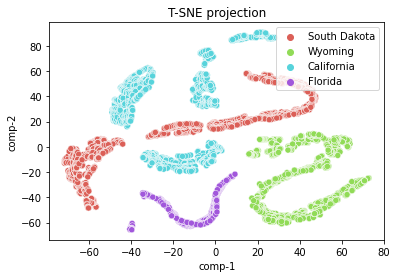

In [264]:
sns.scatterplot(x="comp-1", y="comp-2", hue=df.State.tolist(),
                palette=sns.color_palette("hls", 4),
                data=df).set(title="T-SNE projection") 

### Cluster without PCA:

<div style="direction:rtl; font-size:15px;">ראשית,נמצא את הפיצרים החושבים ביותר ולפיהם נעשה את הפיזור</div>

אילו פיצרים חשובים יותר
https://towardsdatascience.com/feature-selection-techniques-in-machine-learning-with-python-f24e7da3f36e

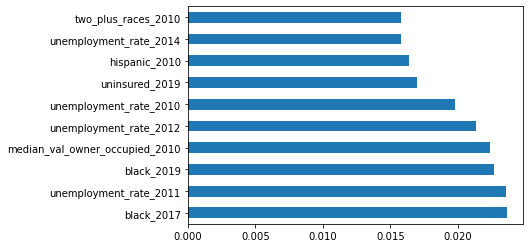

In [338]:
import pandas as pd
import numpy as np

X = df_section_B.iloc[:,1:]  #independent columns
X.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True) # drop the states
y = df_section_B.iloc[:,13:17]    #target column i.e State
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

<div style="direction:rtl; font-size:15px;">שנית,נמצא את הפיצרים הגרועים ביותר ולפיהם נעשה את הפיזור הגרוע</div>

In [341]:
import pandas as pd
import numpy as np

county_list = df_section_B.iloc[:,14:17].columns.tolist()

X = df_section_B.iloc[:,1:]  #independent columns
X.drop(list_of_county, axis=1, inplace=True) # מוחק את המחוזות והמדינות
y = df_section_B.iloc[:,13:17]    #target column i.e State
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.sort_values(ascending=True).head(10)

Year                                            0.000007
Male life expectancy (years)                    0.000107
manufacturer_shipments_2007                     0.000465
Years behind international frontier (female)    0.000552
Years behind international frontier (male)      0.000567
black_owned_firms_2007                          0.000881
mercent_whole_sales_2007                        0.001051
White female life expectancy (years)            0.001095
bachelors_2017                                  0.001119
housing_multi_unit_2010                         0.001161
dtype: float64

<div style="direction:rtl; font-size:15px;">חילקנו את המסד נתונים לפי המדינות, ואז עשינו פיזור לפי הפיצרים הטובים ביותר: black_2010,unemploymeny_rate_2011</div>

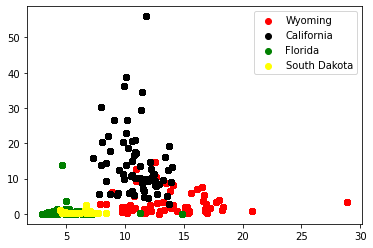

In [143]:
filtered_Wyoming = pd.DataFrame(columns = df_section_B.columns.tolist())
filtered_California = pd.DataFrame(columns = df_section_B.columns.tolist())
filtered_Florida = pd.DataFrame()
filtered_dakota = pd.DataFrame(columns = df_section_B.columns.tolist())

for row in df_section_B.itertuples():
    list_val= []
    for val in row:
        list_val.append(val)
    a_series = pd.Series(list_val[1:], index = df_section_B.columns)
    if(row[16] == 1):
        filtered_Wyoming = filtered_Wyoming.append(a_series, ignore_index=True)
    if(row[15] == 1):
        filtered_California = filtered_California.append(a_series, ignore_index=True)
    if(row[17] == 1):
        filtered_Florida = filtered_Florida.append(a_series, ignore_index=True)
    if(row[14] == 1):
        filtered_dakota = filtered_dakota.append(a_series, ignore_index=True)

fig, ax = plt.subplots()

plt.scatter(filtered_Wyoming.iloc[:,299], filtered_Wyoming.iloc[:,228], c = 'red' ,label = 'Wyoming')
plt.scatter(filtered_California.iloc[:,299] , filtered_California.iloc[:,228]  , c = 'black',label = 'California')
plt.scatter(filtered_Florida.iloc[:,299]  , filtered_Florida.iloc[:,228]  , c = 'green',label = 'Florida')
plt.scatter(filtered_dakota.iloc[:,299]  , filtered_dakota.iloc[:,228]  ,c = 'yellow',label = 'South Dakota')

ax.legend()
plt.show()

<div style="direction:rtl; font-size:15px;">כעת ניקח פיצרים "גרועים" לחלוקה: Male life expectancy (years),Years behind international frontier (female) </div>

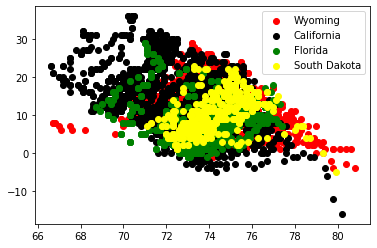

In [353]:
fig, ax = plt.subplots()

plt.scatter(filtered_Wyoming.iloc[:,2]  , filtered_Wyoming.iloc[:,4]  , c = 'red' ,label = 'Wyoming')
plt.scatter(filtered_California.iloc[:,2] , filtered_California.iloc[:,4]  , c = 'black',label = 'California')
plt.scatter(filtered_Florida.iloc[:,2]  , filtered_Florida.iloc[:,4]  , c = 'green',label = 'Florida')
plt.scatter(filtered_dakota.iloc[:,2]  , filtered_dakota.iloc[:,4]  ,c = 'yellow',label = 'South Dakota')

ax.legend()
plt.show()

### B.Bonus

<div style="direction:rtl; font-size:15px;">נחשב את אחוז החלוקה לפי שני הממדים, ונראה כמה אחוז מהתצפיות נכללות בו, האחוז הגבוהה ביותר יהיה הטוב ביותר כי הוא יכלול מספר גבוה יותר של תצפיות</div>

https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

In [52]:
score = 0 
for per in pca.explained_variance_ratio_:
    score+=per
print(score)

0.9766644647150924


<div style="direction:rtl; font-size:15px;"> לפי האופציה השניה עם ה-cluster המדד של החלוקה שלנו מחושב <b>  כמס' הרשומות שהופיעו ביחד באותה קבוצה חלקי מס' הרשומות הכולל של אותה קבוצה</b>, כלומר כמות הרשומות ששבוצו ביחד (בלי קשר לאיזו קבוצה) יעידו שהמודל שלנו שיבץ נכונה את התצפיות האלו.</div>

In [ ]:
#Import required module
from sklearn.cluster import KMeans
#Initialize the class object
kmeans = KMeans(n_clusters= 4)
df = df_section_B
df.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True)
#predict the labels of clusters.
label = kmeans.fit_predict(df)
 
#filter rows of original data
filtered_label0 = df[label == 0]
filtered_label1 = df[label == 1]
filtered_label2 = df[label == 2]
filtered_label3 = df[label == 3]
 
# compare between units to preciptotal
#plotting the results
plt.scatter(filtered_label0.iloc[:,295] , filtered_label0.iloc[:,224] , color = 'red')
plt.scatter(filtered_label1.iloc[:,295] , filtered_label1.iloc[:,224] , color = 'black')
plt.scatter(filtered_label2.iloc[:,295] , filtered_label2.iloc[:,224] , color = 'green')
plt.scatter(filtered_label3.iloc[:,295] , filtered_label3.iloc[:,224] , color = 'yellow')

plt.show()

In [356]:
filtered_California.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True)
filtered_Wyoming.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True)
filtered_Florida.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True)
filtered_dakota.drop(['California','Florida','South dakota','Wyoming'], axis=1, inplace=True)

In [359]:
#We will lower the countries' boxes so that tables are the same size and the rows can be compared

filtered_tables = [filtered_label0,filtered_label1,filtered_label2,filtered_label3] #kmeans grouped list
original_tables = [filtered_California,filtered_Wyoming,filtered_Florida,filtered_dakota] #Our division
dup_measure = 0

for table in filtered_tables:
    for org_table in original_tables:
        merge = table.append(org_table, ignore_index=True) # We will connect two tables to one
        duplicate = merge[merge.duplicated()] #We will check how many records are in the same group
        dup_measure += (len(duplicate)/2)/len(table) # Because he takes the two records together
        
print("The mesasure of grouping is: " + str(dup_measure/4))
        

The mesasure of grouping is: 0.5


# Section C

### Section C.1

In [26]:
# get total number of district per state

def return_value(x):
    if(list(set(x))[0] == 0):
        return 0
    else:
        return len(list(set(x)))

df_house_dis = df_house[['year','state','district']] 
df_house_group_with_number_of_district = df_house_dis.groupby(by=['year','state'],as_index=False).agg(lambda x: return_value(x))
df_house_group_with_number_of_district

,year,state,district
0,1976,ALABAMA,7
1,1976,ALASKA,0
2,1976,ARIZONA,4
3,1976,ARKANSAS,4
4,1976,CALIFORNIA,43
...,...,...,...
1146,2020,VIRGINIA,11
1147,2020,WASHINGTON,10
1148,2020,WEST VIRGINIA,3
1149,2020,WISCONSIN,8


In [27]:
def return_value(x):
    if(isinstance(list(x)[0], (int, np.integer))):
        return sum(list((x)))       
    else:
        if(len(set(x)) ==1):
            return list(x)[0]
        else:
            return list(set(x))

df_house_group = df_house.groupby(by=['year','state'],as_index=False).agg(lambda x: return_value(x))
df_house_group.drop(['state_cen','state_ic','state_fips','district','totalvotes','version','candidate'], axis=1, inplace=True)
df_house_group.rename(columns = {'candidatevotes':'totalvotes'}, inplace = True)
df_house_group

,year,state,state_po,office,stage,runoff,special,party,writein,mode,totalvotes,unofficial,fusion_ticket
0,1976,ALABAMA,AL,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, NATIONAL DEMOCRAT, REPUBLICAN,...",6,TOTAL,984181,0,0
1,1976,ALASKA,AK,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,118208,0,0
2,1976,ARIZONA,AZ,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN, LIBERTARIAN, INDEPENDENT]",0,TOTAL,729002,0,0
3,1976,ARKANSAS,AR,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,336391,0,0
4,1976,CALIFORNIA,CA,US HOUSE,GEN,0.0,0,"[DEMOCRAT, AMERICAN INDEPENDENT, PEACE AND FRE...",0,TOTAL,7442501,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1146,2020,VIRGINIA,VA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",11,TOTAL,4335436,0,2
1147,2020,WASHINGTON,WA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",10,TOTAL,3944233,0,0
1148,2020,WEST VIRGINIA,WV,US HOUSE,GEN,0.0,0,"[WRITE-IN, DEMOCRAT, REPUBLICAN]",0,TOTAL,761385,0,0
1149,2020,WISCONSIN,WI,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",8,TOTAL,3238051,0,0


In [28]:
# add the number of district to table
df_house_group= pd.merge(left = df_house_group, right = df_house_group_with_number_of_district, how = 'inner' , on = ['year','state'])
df_house_group

,year,state,state_po,office,stage,runoff,special,party,writein,mode,totalvotes,unofficial,fusion_ticket,district
0,1976,ALABAMA,AL,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, NATIONAL DEMOCRAT, REPUBLICAN,...",6,TOTAL,984181,0,0,7
1,1976,ALASKA,AK,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,118208,0,0,0
2,1976,ARIZONA,AZ,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN, LIBERTARIAN, INDEPENDENT]",0,TOTAL,729002,0,0,4
3,1976,ARKANSAS,AR,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,336391,0,0,4
4,1976,CALIFORNIA,CA,US HOUSE,GEN,0.0,0,"[DEMOCRAT, AMERICAN INDEPENDENT, PEACE AND FRE...",0,TOTAL,7442501,0,0,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1146,2020,VIRGINIA,VA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",11,TOTAL,4335436,0,2,11
1147,2020,WASHINGTON,WA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",10,TOTAL,3944233,0,0,10
1148,2020,WEST VIRGINIA,WV,US HOUSE,GEN,0.0,0,"[WRITE-IN, DEMOCRAT, REPUBLICAN]",0,TOTAL,761385,0,0,3
1149,2020,WISCONSIN,WI,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",8,TOTAL,3238051,0,0,8


In [29]:
def return_value(x):
    if(isinstance(list(x)[0], (int, np.integer))):
        return sum(list((x)))       
    else:
        if(len(set(x)) ==1):
            return list(x)[0]
        else:
            return list(set(x))

df_president_group = df_president.groupby(by=['year','state'],as_index=False).sum()
df_president_group = df_president_group[['year','state','candidatevotes']]
df_president_group

,year,state,candidatevotes
0,1976,ALABAMA,1182850
1,1976,ALASKA,123574
2,1976,ARIZONA,742719
3,1976,ARKANSAS,767535
4,1976,CALIFORNIA,7803770
...,...,...,...
607,2020,VIRGINIA,4460524
608,2020,WASHINGTON,4087631
609,2020,WEST VIRGINIA,794652
610,2020,WISCONSIN,3298041


<div style="direction:rtl; font-size:20px;"><b>על מנת למצוא את אחוז ההצבעה לקחנו את סך ההצבעות שהיו בבחירות לhouse באותה מדינה וחילקנו בכמות ההצבעות שהיו לנשיאות באותה המדינה ובאותה שנה, נשים לב שכמות ההצבעות לנשיאות תמיד גבוהה יותר</b> </div>

In [30]:
df_house_president = pd.merge(left = df_house_group, right = df_president_group, how = 'inner' , on = ['year','state'])
df_house_president.rename(columns = {'totalvotes':'totalvotes_house','candidatevotes':'totalvote_president'}, inplace = True)
df_house_president['Voter_Turnout'] = None #add new column
df_house_president['Voter_Turnout'] = pd.to_numeric(df_house_president['Voter_Turnout'],downcast='float')

for row in df_house_president.itertuples():
    df_house_president.at[row[0],'Voter_Turnout'] = float(row[11]/row[15]) #total house vote / total persident vote on this state

df_house_president

,year,state,state_po,office,stage,runoff,special,party,writein,mode,totalvotes_house,unofficial,fusion_ticket,district,totalvote_president,Voter_Turnout
0,1976,ALABAMA,AL,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, NATIONAL DEMOCRAT, REPUBLICAN,...",6,TOTAL,984181,0,0,7,1182850,0.832042
1,1976,ALASKA,AK,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,118208,0,0,0,123574,0.956577
2,1976,ARIZONA,AZ,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN, LIBERTARIAN, INDEPENDENT]",0,TOTAL,729002,0,0,4,742719,0.981531
3,1976,ARKANSAS,AR,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",1,TOTAL,336391,0,0,4,767535,0.438274
4,1976,CALIFORNIA,CA,US HOUSE,GEN,0.0,0,"[DEMOCRAT, AMERICAN INDEPENDENT, PEACE AND FRE...",0,TOTAL,7442501,0,0,43,7803770,0.953706
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,2020,VIRGINIA,VA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",11,TOTAL,4335436,0,2,11,4460524,0.971957
597,2020,WASHINGTON,WA,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN]",10,TOTAL,3944233,0,0,10,4087631,0.964919
598,2020,WEST VIRGINIA,WV,US HOUSE,GEN,0.0,0,"[WRITE-IN, DEMOCRAT, REPUBLICAN]",0,TOTAL,761385,0,0,3,794652,0.958136
599,2020,WISCONSIN,WI,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, INDEPENDENT]",8,TOTAL,3238051,0,0,8,3298041,0.981810


### Section C.2

<div style="direction:rtl; font-size:15px;">נוסיף שורה של שנת 2010 לכל מדינה ע"מ בהמשך להוסיף נתונים ולחזות את שנת 2010.
<br>- שנת 2010 אינה מופיעה בטבלה של בחירות לנשיאות ולכן הוספנו אותה.</div>

In [31]:
states = list(df_house_president['state'][0:50])
district_num = list((df_house_president['district'][0:50]))
list_states = []

for state,district in zip(states,district_num):
    list_states.append([2010,state,None,None,None,0,0,['nan'],0,'TOTAL',0,0,0,district,0,None])
    
df_2010 = pd.DataFrame(list_states, columns =df_house_president.columns.tolist())

In [32]:
df_house_president = pd.concat([df_house_president, df_2010], axis=0)
df_house_president.sort_values(by=['year'])

,year,state,state_po,office,stage,runoff,special,party,writein,mode,totalvotes_house,unofficial,fusion_ticket,district,totalvote_president,Voter_Turnout
0,1976,ALABAMA,AL,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, NATIONAL DEMOCRAT, REPUBLICAN,...",6,TOTAL,984181,0,0,7,1182850,0.832042
27,1976,NEVADA,NV,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, LIBERTARIAN, REPUBLICAN, INDEP...",0,TOTAL,199863,0,0,0,201876,0.990029
28,1976,NEW HAMPSHIRE,NH,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN, LIBERTARIAN]",0,TOTAL,324945,0,0,2,339627,0.95677
29,1976,NEW JERSEY,NJ,US HOUSE,GEN,0.0,0,"[NEW MAJORITY, BRING US TOGETHER, SILENT MAJOR...",0,TOTAL,2810793,0,0,15,3014472,0.932433
30,1976,NEW MEXICO,NM,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN, LA RAZA UNIDA]",0,TOTAL,401240,0,0,2,416590,0.963153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
580,2020,NEW JERSEY,NJ,US HOUSE,GEN,0.0,0,"[DEMOCRAT, VETERAN FOR CHANGE, BUILDING YOUR L...",0,TOTAL,4432923,0,0,12,4549353,0.974407
579,2020,NEW HAMPSHIRE,NH,US HOUSE,GEN,0.0,0,"[nan, DEMOCRAT, REPUBLICAN, LIBERTARIAN]",2,TOTAL,787102,0,0,2,806182,0.976333
578,2020,NEVADA,NV,US HOUSE,GEN,0.0,0,"[LIBERTARIAN, DEMOCRAT, REPUBLICAN, INDEPENDEN...",0,TOTAL,1355607,0,0,4,1405376,0.964587
576,2020,MONTANA,MT,US HOUSE,GEN,0.0,0,"[DEMOCRAT, REPUBLICAN]",0,TOTAL,601509,0,0,0,603674,0.996414


In [33]:
# get categorical variables after dropping observations
from itertools import chain

partys = df_house_president['party'].tolist()
partys = list(map(str, chain.from_iterable(partys)))
partys = list(set(partys)) # list of all partys


partys_df = pd.DataFrame(columns = partys)
# add new encoded variables to the dataframe
df_house_president = pd.concat([df_house_president, partys_df], axis=1)

for row in df_house_president.itertuples():
    for party in partys:
        if(row[8] is not None and party in row[8]):
            df_house_president.at[row[0],party]=1
            
for party in partys:
    df_house_president[party].replace(np.NaN, 0, inplace=True)
         
# drop categorical variables
df_house_president.drop(['party'], axis=1, inplace=True) 


In [34]:
df_house_president['state'] = df_house_president['state'].str.capitalize() 
df_house_president.rename(columns = {'state':'State'}, inplace = True)
df_house_president_2002_2012 = df_house_president[df_house_president['year'].isin([2000,2004,2008,2010,2012])]
df_house_president_2002_2012 # after one hot encoding for party column

,year,State,state_po,office,stage,runoff,special,writein,mode,totalvotes_house,...,TAX REVOLT,TEDDY ROOSEVELT PROGRESSIVE,LEGALIZE MARIJUANA PARTY,THE INDEPENDENT ALTERNATIVE,WORKERS,INDEPENDENT GREEN,PRO-LIFE,WRITE-IN (INDEPENDENT),WORKERS LEAGUE,INDEPENDENT AMERICAN
300,2000,Alabama,AL,US HOUSE,GEN,0.0,0,7,TOTAL,1438994,...,0,0,0,0,0,0,0,0,0,0
301,2000,Alaska,AK,US HOUSE,GEN,0.0,0,1,TOTAL,274393,...,0,0,0,0,0,0,0,0,0,0
302,2000,Arizona,AZ,US HOUSE,GEN,0.0,0,0,TOTAL,1465656,...,0,0,0,0,0,0,0,0,0,0
303,2000,Arkansas,AR,US HOUSE,GEN,0.0,0,1,TOTAL,632766,...,0,0,0,0,0,0,0,0,0,0
304,2000,California,CA,US HOUSE,GEN,0.0,0,0,TOTAL,10436607,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,2010,Virginia,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,0,0
46,2010,Washington,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,0,0
47,2010,West virginia,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,0,0
48,2010,Wisconsin,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,0,0


In [35]:
df_county_data_landarea_group = df_county_data_landarea.groupby(by=['State'],as_index=False).sum()
df_county_data_landarea_group['State'] = df_county_data_landarea_group['State'].str.capitalize() 
df_county_data_landarea_group.drop(['FIPS'], axis=1, inplace=True)
df_house_president= pd.merge(left = df_house_president_2002_2012, right = df_county_data_landarea_group, how = 'inner' , on = ['State'])
df_house_president

,year,State,state_po,office,stage,runoff,special,writein,mode,totalvotes_house,...,TEDDY ROOSEVELT PROGRESSIVE,LEGALIZE MARIJUANA PARTY,THE INDEPENDENT ALTERNATIVE,WORKERS,INDEPENDENT GREEN,PRO-LIFE,WRITE-IN (INDEPENDENT),WORKERS LEAGUE,INDEPENDENT AMERICAN,Land Area
0,2000,Alabama,AL,US HOUSE,GEN,0.0,0,7,TOTAL,1438994,...,0,0,0,0,0,0,0,0,0,131443.1
1,2004,Alabama,AL,US HOUSE,GEN,0.0,0,7,TOTAL,1792759,...,0,0,0,0,0,0,0,0,0,131443.1
2,2008,Alabama,AL,US HOUSE,GEN,NaN,0,7,TOTAL,1855268,...,0,0,0,0,0,0,0,0,0,131443.1
3,2012,Alabama,AL,US HOUSE,GEN,NaN,0,7,TOTAL,1933630,...,0,0,0,0,0,0,0,0,0,131443.1
4,2010,Alabama,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,0,131443.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,2000,Wyoming,WY,US HOUSE,GEN,0.0,0,0,TOTAL,212312,...,0,0,0,0,0,0,0,0,0,251500.8
236,2004,Wyoming,WY,US HOUSE,GEN,0.0,0,1,TOTAL,239163,...,0,0,0,0,0,0,0,0,0,251500.8
237,2008,Wyoming,WY,US HOUSE,GEN,NaN,0,1,TOTAL,249575,...,0,0,0,0,0,0,0,0,0,251500.8
238,2012,Wyoming,WY,US HOUSE,GEN,NaN,0,1,TOTAL,250700,...,0,0,0,0,0,0,0,0,0,251500.8


In [36]:
df_Economic['Date'] = pd.to_datetime(df_Economic['Date'])
for row in df_Economic.itertuples():
    df_Economic.at[row[0],'Date'] = int(row[1].year)

df_Economic = df_Economic.groupby(by=['Date'],as_index=False).max()
df_Economic.rename(columns = {'Date':'year'}, inplace = True)
df_Economic = df_Economic[df_Economic['year'].isin([2000,2004,2008,2010,2012])]

In [37]:
df_Economic

,year,Value
104,2000,11722.98
108,2004,10854.54
112,2008,13058.20
114,2010,11585.38
116,2012,13610.15


In [38]:
df_house_president= pd.merge(left = df_house_president, right = df_Economic, how = 'inner' , on = ['year'])
df_house_president

,year,State,state_po,office,stage,runoff,special,writein,mode,totalvotes_house,...,LEGALIZE MARIJUANA PARTY,THE INDEPENDENT ALTERNATIVE,WORKERS,INDEPENDENT GREEN,PRO-LIFE,WRITE-IN (INDEPENDENT),WORKERS LEAGUE,INDEPENDENT AMERICAN,Land Area,Value
0,2000,Alabama,AL,US HOUSE,GEN,0.0,0,7,TOTAL,1438994,...,0,0,0,0,0,0,0,0,131443.1,11722.98
1,2000,Arizona,AZ,US HOUSE,GEN,0.0,0,0,TOTAL,1465656,...,0,0,0,0,0,0,0,0,294333.6,11722.98
2,2000,Arkansas,AR,US HOUSE,GEN,0.0,0,1,TOTAL,632766,...,0,0,0,0,0,0,0,0,134874.6,11722.98
3,2000,California,CA,US HOUSE,GEN,0.0,0,0,TOTAL,10436607,...,0,0,0,0,0,0,0,0,403970.1,11722.98
4,2000,Colorado,CO,US HOUSE,GEN,0.0,0,2,TOTAL,1623882,...,0,0,0,0,0,0,0,0,268659.2,11722.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,2010,Virginia,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,102558.0,11585.38
236,2010,Washington,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,172447.2,11585.38
237,2010,West virginia,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,62384.2,11585.38
238,2010,Wisconsin,None,None,None,0.0,0,0,TOTAL,0,...,0,0,0,0,0,0,0,0,140672.6,11585.38


<div style="direction:rtl; font-size:15px;">ניקח מטבלת Life_Expecntancy רק את שנים 2000,2004,2007.<br>את  שנת 2007 נחליף ל-2008 מאחר וזוהי  השנה הכי קרובה ל-2008 ונוכל להניח שהנתונים השתנו במעט.</div>

In [23]:
df_Life_Expectancy_sectionC = df_Life_Expectancy[['State','Year','Male life expectancy (years)','Female life expectancy (years)'
                                                          ,'White male life expectancy (years)','White female life expectancy (years)','Black female life expectancy (years)','Black male life expectancy (years)']]
df_Life_Expectancy_sectionC = df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['Year'].isin([2000,2004,2007])]
df_Life_Expectancy_sectionC = df_Life_Expectancy_sectionC.groupby(by=['Year','State'],as_index=False).mean()
df_Life_Expectancy_sectionC['Year'].replace(2007, 2008, inplace=True) # We will put the values of 2007 around 2008 on the assumption that they will not change much this year
df_Life_Expectancy_sectionC['State'] = df_Life_Expectancy_sectionC['State'].str.capitalize()
df_Life_Expectancy_sectionC.rename(columns = {'Year':'year'}, inplace = True)
df_Life_Expectancy_sectionC

,year,State,Male life expectancy (years),Female life expectancy (years),White male life expectancy (years),White female life expectancy (years),Black female life expectancy (years),Black male life expectancy (years)
0,2000,Alabama,70.517910,77.532836,72.276119,78.929851,74.015686,66.038636
1,2000,Alaska,74.500000,79.600000,73.900000,79.000000,NaN,67.600000
2,2000,Arizona,73.726667,79.773333,73.246667,79.386667,75.800000,68.350000
3,2000,Arkansas,71.388000,78.172000,72.361333,78.932000,73.672222,65.489655
4,2000,California,75.182759,80.160345,75.139655,80.084483,75.780952,70.182353
...,...,...,...,...,...,...,...,...
148,2008,Virginia,73.725000,79.399265,74.750735,80.195588,76.356322,69.376923
149,2008,Washington,76.253846,80.802564,76.158974,80.712821,77.750000,72.200000
150,2008,West virginia,72.636364,78.598182,72.749091,78.681818,72.933333,66.400000
151,2008,Wisconsin,76.176389,81.226389,76.172222,81.212500,76.633333,71.600000


<div style="direction:rtl; font-size:15px;">שמנו לב שהערכים כל 4 שנים עולים בערך ב0.5 , ולכן נשים ב-2010 את הערכים של 2008 פלוס 0.5, וב-2012 נשים את הערכים פלוס 1</div>


In [24]:
states = list(df_Life_Expectancy_sectionC['State'][0:50])
Male_life = list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['Male life expectancy (years)'][0:50])
Female_life = list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['Female life expectancy (years)'][0:50])
White_male_life = list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['White male life expectancy (years)'][0:50])
White_female_life= list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['White female life expectancy (years)'][0:50])
Black_male_life = list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['Black male life expectancy (years)'][0:50])
Black_female_life = list(df_Life_Expectancy_sectionC[df_Life_Expectancy_sectionC['year']==2008]['Black female life expectancy (years)'][0:50])
list_rows_2010 =[]
list_rows_2012 =[]

for state,male,female,whitemale,whitefemale,blackmale,blackfemale in zip(states,Male_life,Female_life,White_male_life,White_female_life,Black_male_life,Black_female_life):
    list_rows_2010.append([2010,state,male+0.5,female+0.5,whitemale+0.5,whitefemale+0.5,blackmale+0.5,blackfemale+0.5])
    
for state,male,female,whitemale,whitefemale,blackmale,blackfemale in zip(states,Male_life,Female_life,White_male_life,White_female_life,Black_male_life,Black_female_life):
    list_rows_2012.append([2012,state,male+1,female+1,whitemale+1,whitefemale+1,blackmale+1,blackfemale+1])
    
df_2010 = pd.DataFrame(list_rows_2010, columns =df_Life_Expectancy_sectionC.columns.tolist())
df_2012 = pd.DataFrame(list_rows_2012, columns =df_Life_Expectancy_sectionC.columns.tolist())

In [25]:
df_Life_Expectancy_sectionC = pd.concat([df_Life_Expectancy_sectionC, df_2010], axis=0)
df_Life_Expectancy_sectionC = pd.concat([df_Life_Expectancy_sectionC, df_2012], axis=0)
df_Life_Expectancy_sectionC.sort_values(by=['year'])

,year,State,Male life expectancy (years),Female life expectancy (years),White male life expectancy (years),White female life expectancy (years),Black female life expectancy (years),Black male life expectancy (years)
0,2000,Alabama,70.517910,77.532836,72.276119,78.929851,74.015686,66.038636
28,2000,Nevada,73.782353,79.488235,73.829412,79.423529,74.000000,67.200000
29,2000,New hampshire,75.500000,80.550000,75.500000,80.560000,NaN,NaN
30,2000,New jersey,74.790476,79.814286,75.371429,80.304762,75.833333,69.741176
31,2000,New mexico,73.639394,79.893939,73.424242,79.727273,75.900000,68.400000
...,...,...,...,...,...,...,...,...
19,2012,Maine,76.581250,81.587500,76.568750,81.568750,NaN,NaN
20,2012,Maryland,75.837500,81.058333,76.766667,81.783333,71.937500,78.078947
21,2012,Massachusetts,78.128571,82.871429,78.285714,82.992857,73.014286,79.440000
11,2012,Hawaii,78.060000,84.340000,75.340000,81.780000,70.500000,NaN


In [26]:
df_house_president = pd.merge(left = df_house_president, right = df_Life_Expectancy_sectionC, how = 'left' , on = ['State','year'])
df_house_president = df_house_president.sort_values(by=['year'])

<div style="direction:rtl; font-size:15px;"><u> הוספנו כמה עמודות חדשות שישמשו כפיצרים לחיזוי שיעור ההצבעה, העמודות הן:</u> <br>
-<u> Land Area: </u> אנחנו מניחים שככל ששטח המדינה גדול יותר, כמות האוכלוסייה גדלה יותר והסיכוי ששיעור ההצבעה יקטן יהיה גבוה יותר.<br>
- <u>Value :</u> לקחנו עבור כל שנה את המחיר הסגירה המקסימלי שיכול לתת מדד מסויים על שביעות הרצון של האוכלוסייה, כלומר ממד נמוך יכול לגרום לאנשים לצאת להצביע בבחירות הבאות ,לקחנו את זה מטבלה המציגה נתונים כלכליים, ערך זה הוא מחיר הסגירה של הממוצע התעשייתי של דאו ג'ונס (מנייה אינדיקטור שוק).
<br>-<u> District :</u> כמה מחוזות יש בתוך המדינה, מס' המחוזות משפיע על מספר הנציגים ששולחים לבחירות ולכן עבור כל מדינה יכול להוות מדד לכמות אחוזי ההצבעה
<br>-<u>Male life expectancy :</u> מדד התוחלת חיים של הגברים יכולה להשפיע על אחוזי ההצבעה (כאשר מבוגרים סביר להניח יצביעו יותר)
<br>-<u>Female life expectancy :</u> (מדד התוחלת חיים של הנשים יכולה להשפיע על אחוזי ההצבעה (כאשר מבוגרים סביר להניח יצביעו יותר
<br>-<u>White male life expectancy :</u> מדד התוחלת חיים של הגברים לבנים יכולה להשפיע על אחוזי ההצבעה במדינות שיש רוב לבן
<br>-<u>White female life expectancy :</u> מדד התוחלת חיים של נשים לבנות יכולה להשפיע על אחוזי ההצבעה במדינות שיש רוב לבן
<br>-<u>Black male life expectancy :</u> מדד התוחלת חיים של גברים שחורים יכולה להשפיע על אחוזי ההצבעה במדינות שיש רוב שחור
<br>-<u>Black female life expectancy :</u> מדד התוחלת חיים של נשים שחורות יכולה להשפיע על אחוזי ההצבעה במדינות שיש רוב שחור

</div>

In [27]:
# We will throw out features that can affect our prediction, as well as we will throw out features with fixed values
df_house_president.drop(['state_po','office','stage','mode','totalvotes_house','totalvote_president'], axis=1, inplace=True)

In [28]:
df_house_president

,year,State,runoff,special,writein,unofficial,fusion_ticket,district,Voter_Turnout,SMALL IS BEAUTIFUL,...,BACK TO BASICS,"PEACE, JOBS, JUSTICE",Land Area,Value,Male life expectancy (years),Female life expectancy (years),White male life expectancy (years),White female life expectancy (years),Black female life expectancy (years),Black male life expectancy (years)
0,2000,Alabama,0.0,0,7,0,0,7,0.863601,0,...,0,0,131443.1,11722.98,70.517910,77.532836,72.276119,78.929851,74.015686,66.038636
26,2000,New hampshire,0.0,0,0,0,0,2,0.9771,0,...,0,0,23230.8,11722.98,75.500000,80.550000,75.500000,80.560000,NaN,NaN
27,2000,New jersey,0.0,0,0,0,0,13,0.937565,0,...,0,0,19214.5,11722.98,74.790476,79.814286,75.371429,80.304762,75.833333,69.741176
28,2000,New mexico,0.0,0,0,0,0,3,0.981472,0,...,0,0,314334.1,11722.98,73.639394,79.893939,73.424242,79.727273,75.900000,68.400000
29,2000,New york,0.0,0,0,0,120,31,0.998342,0,...,0,0,122309.8,11722.98,74.816129,79.991935,75.104839,80.182258,76.444444,70.537500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,2012,New hampshire,NaN,0,2,0,0,2,0.959835,0,...,0,0,23230.8,13610.15,77.790000,82.490000,77.780000,82.480000,NaN,NaN
169,2012,Nevada,NaN,0,0,0,0,4,0.959429,0,...,0,0,284397.2,13610.15,75.488235,80.947059,75.452941,80.829412,69.600000,76.400000
168,2012,Nebraska,NaN,0,0,0,0,3,0.972477,0,...,0,0,199113.1,13610.15,76.874194,81.934409,76.859140,81.919355,72.000000,78.100000
190,2012,Wisconsin,NaN,0,10,0,0,8,0.933131,0,...,0,0,140672.6,13610.15,77.176389,82.226389,77.172222,82.212500,72.600000,77.633333


In [29]:
# one hot encoding for states

states_2012= df_house_president[df_house_president['year']==2012]['State'].tolist() #for C.4 section

states = list(set(df_house_president['State']))
states_df_1 = pd.DataFrame(columns = states)

df_house_president = pd.concat([df_house_president, states_df_1], axis=1)

#fill the columns

for row in df_house_president.itertuples(): # put 1 on the current store column
    df_house_president.at[row[0],str(row[2])]=1
for state in states:
    df_house_president[state].replace(np.NaN, 0, inplace=True)
df_house_president.drop(['State'], axis=1, inplace=True)

In [30]:
df_house_president

,year,runoff,special,writein,unofficial,fusion_ticket,district,Voter_Turnout,SMALL IS BEAUTIFUL,MAGERMAN FOR CONGRESS,...,Rhode island,Minnesota,Vermont,Indiana,South carolina,Arizona,Arkansas,Ohio,North dakota,New mexico
0,2000,0.0,0,7,0,0,7,0.863601,0,0,...,0,0,0,0,0,0,0,0,0,0
26,2000,0.0,0,0,0,0,2,0.9771,0,0,...,0,0,0,0,0,0,0,0,0,0
27,2000,0.0,0,0,0,0,13,0.937565,0,0,...,0,0,0,0,0,0,0,0,0,0
28,2000,0.0,0,0,0,0,3,0.981472,0,0,...,0,0,0,0,0,0,0,0,0,1
29,2000,0.0,0,0,0,120,31,0.998342,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,2012,NaN,0,2,0,0,2,0.959835,0,0,...,0,0,0,0,0,0,0,0,0,0
169,2012,NaN,0,0,0,0,4,0.959429,0,0,...,0,0,0,0,0,0,0,0,0,0
168,2012,NaN,0,0,0,0,3,0.972477,0,0,...,0,0,0,0,0,0,0,0,0,0
190,2012,NaN,0,10,0,0,8,0.933131,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_house_president)

# replace values in the dataset with new imputed values
df_house_president[df_house_president.columns] = imputed
df_house_president.isna().sum()

year            0
runoff          0
special         0
writein         0
unofficial      0
               ..
Arizona         0
Arkansas        0
Ohio            0
North dakota    0
New mexico      0
Length: 354, dtype: int64

### Section C.3

## 2010 Predict:

In [61]:
X_train = df_house_president[df_house_president['year'].isin([2000,2004,2008])]
X_train.drop(['Voter_Turnout','runoff',], axis=1, inplace=True)

Y_train = df_house_president[df_house_president['year'].isin([2000,2004,2008])]
Y_train= Y_train['Voter_Turnout']

X_test= df_house_president[df_house_president['year'].isin([2010])]
X_test.drop(['Voter_Turnout','runoff'], axis=1, inplace=True)

Y_test= df_house_president[df_house_president['year'].isin([2010])]['Voter_Turnout']

### Gradient Boosting Regressor

In [69]:
gb = GradientBoostingRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5],
    'n_estimators': [50, 100]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'Gradient Boosting Regressor'}, columns={0: 'MSE'})
df

,MSE
Gradient Boosting Regressor,0.001


In [70]:
califorina_per = y_pred[17]
florida_per = y_pred[10]
south_dakota = y_pred[31]
wyoming = y_pred[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.940647
Florida,0.903611
South Dakota,0.976996
Wyoming,0.984283


In [64]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)

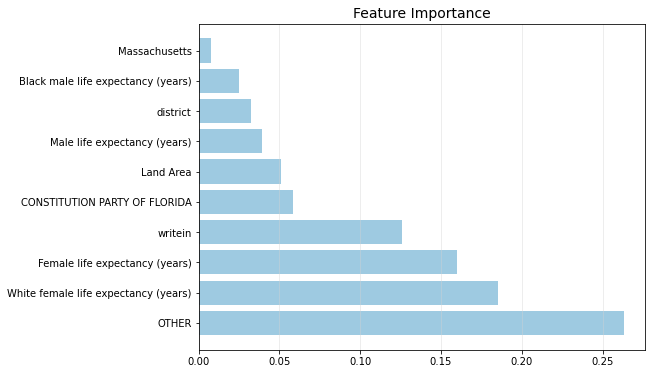

In [65]:
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

### Random Forest Regressor

In [66]:
# define model
rf = RandomForestRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [2, 3],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [2, 8],
    'n_estimators': [20, 50]
}

grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'Random Forest Regressor'}, columns={0: 'MSE'})
df

,MSE
Random Forest Regressor,0.003


In [67]:
califorina_per = y_pred[17]
florida_per = y_pred[10]
south_dakota = y_pred[31]
wyoming = y_pred[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.961868
Florida,0.964639
South Dakota,0.964520
Wyoming,0.967211


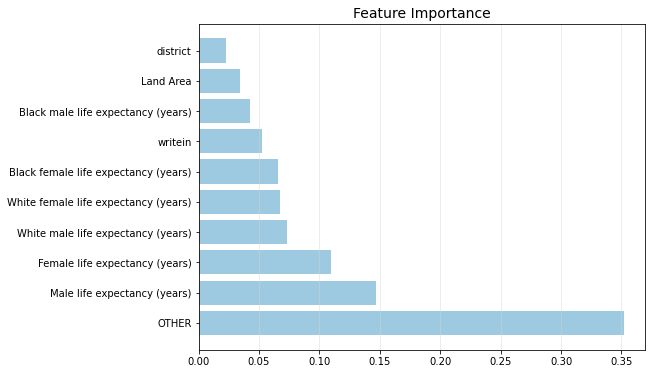

In [68]:
# get feature importance
imp = pd.DataFrame(best.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

### AdaBoost Regressor

In [69]:
# adaboost
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# define model
ab = AdaBoostRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_estimators': [20, 50]
}

# define grid search
grid_search = GridSearchCV(estimator=ab, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'AdaBoost Regressor'}, columns={0: 'MSE'})
df

,MSE
AdaBoost Regressor,0.003


In [70]:
califorina_per = y_pred[17]
florida_per = y_pred[10]
south_dakota = y_pred[31]
wyoming = y_pred[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.950556
Florida,0.944375
South Dakota,0.958500
Wyoming,0.958828


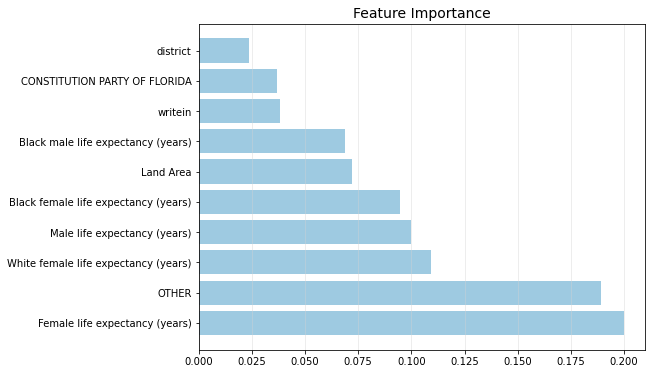

In [71]:
# get feature importance
imp = pd.DataFrame(best.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [35]:
data = [["AdaBoost","0.003"],["Random Forest Regressor","0.003"],["Gradient Boosting Regressor","0.001"]]
pd.DataFrame(data, columns=["Type","MSE"])

,Type,MSE
0,AdaBoost,0.003
1,Random Forest Regressor,0.003
2,Gradient Boosting Regressor,0.001


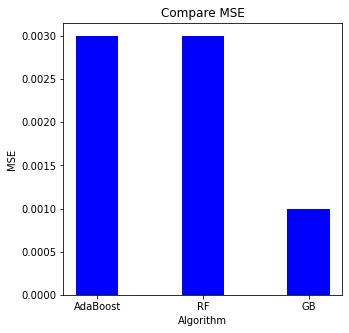

In [6]:
# creating the dataset
data = {'AdaBoost':0.003, 'RF':0.003, 'GB':0.001}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)
 
plt.xlabel("Algorithm")
plt.ylabel("MSE")
plt.title("Compare MSE")
plt.show()

<div style="direction:rtl; font-size:15px;"><b>על מנת לקבל חיזוי מדויק מכל האלגוריתם השונים שהשתמשנו, נחשב את הממוצע של הערך שיצא לנו </b></div>


In [22]:
# cal avg
import statistics
califorina_avg_2010 = statistics.mean([0.940647,0.950556,0.961868])
florida_avg_2010 = statistics.mean([0.903611,0.944375,0.964639])
south_dakota_avg_2010 = statistics.mean([0.976996,0.9585,0.964520])
wyoming_avg_2010 = statistics.mean([0.984283,0.958828,0.967211])

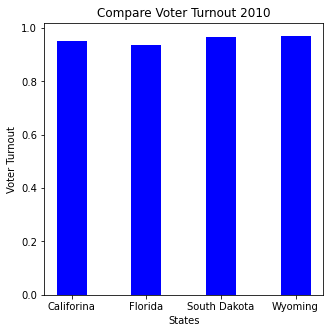

In [23]:
# creating the dataset
data = {'Califorina':califorina_avg_2010, 'Florida':florida_avg_2010, 'South Dakota':south_dakota_avg_2010,'Wyoming':wyoming_avg_2010}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)
 
plt.xlabel("States")
plt.ylabel("Voter Turnout")
plt.title("Compare Voter Turnout 2010")
plt.show()

## 2012 Predict:

In [32]:
X_train = df_house_president[df_house_president['year'].isin([2000,2004,2008,2010])]

X_train.drop(['Voter_Turnout','runoff'], axis=1, inplace=True)

Y_train = df_house_president[df_house_president['year'].isin([2000,2004,2008,2010])]
Y_train= Y_train['Voter_Turnout']

X_test= df_house_president[df_house_president['year'].isin([2012])]
X_test.drop(['Voter_Turnout','runoff'], axis=1, inplace=True)

Y_test= df_house_president[df_house_president['year'].isin([2012])]['Voter_Turnout']

### Gradient Boosting Regressor

In [33]:
gb = GradientBoostingRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5],
    'n_estimators': [50, 100]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'Gradient Boosting Regressor'}, columns={0: 'MSE'})
df

,MSE
Gradient Boosting Regressor,0.003


In [79]:
califorina_per = y_pred[17]
florida_per = y_pred[10]
south_dakota = y_pred[31]
wyoming = y_pred[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.938454
Florida,0.908193
South Dakota,0.937270
Wyoming,0.930772


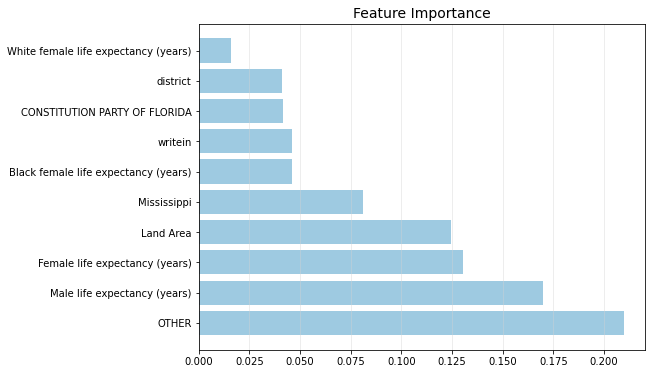

In [77]:
# get feature importance
imp = pd.DataFrame(best.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

### Random Forest Regressor

In [78]:
# define model
rf = RandomForestRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [2, 3],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [2, 8],
    'n_estimators': [20, 50]
}

grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred_rf = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred_rf), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'Random Forest Regressor'}, columns={0: 'MSE'})
df

,MSE
Random Forest Regressor,0.001


In [79]:
califorina_per = y_pred_rf[17]
florida_per = y_pred_rf[10]
south_dakota = y_pred_rf[31]
wyoming = y_pred_rf[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.954708
Florida,0.940324
South Dakota,0.916771
Wyoming,0.943909


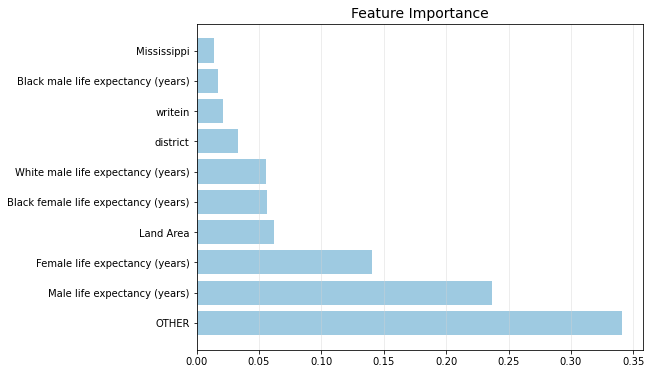

In [80]:
# get feature importance
imp = pd.DataFrame(best.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

### AdaBoost Regressor

In [177]:
# adaboost
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# define model
ab = AdaBoostRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_estimators': [20, 50]
}

# define grid search
grid_search = GridSearchCV(estimator=ab, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'AdaBoost Regressor'}, columns={0: 'MSE'})
df

,MSE
AdaBoost Regressor,0.001


In [178]:
califorina_per = y_pred[17]
florida_per = y_pred[10]
south_dakota = y_pred[31]
wyoming = y_pred[46]

dic_per = {'Califorina':califorina_per,'Florida':florida_per,'South Dakota':south_dakota,'Wyoming':wyoming}
pd.DataFrame.from_dict(dic_per, columns = ['Voter_Turnout'],orient='index')

,Voter_Turnout
Califorina,0.939631
Florida,0.928572
South Dakota,0.911814
Wyoming,0.923367


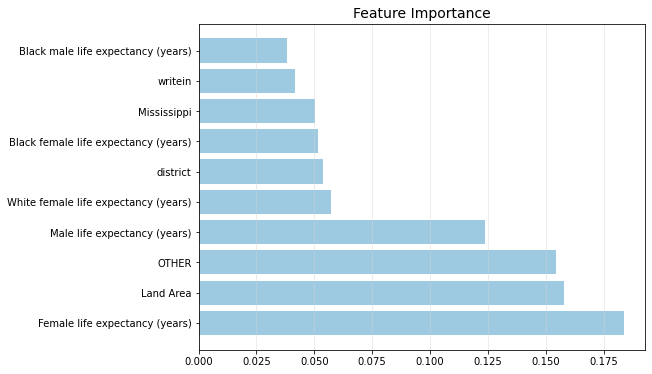

In [179]:
# get feature importance
imp = pd.DataFrame(best.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values(['Importance'],ascending=False).head(10)
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [34]:
data = [["AdaBoost","0.001"],["Random Forest Regressor","0.001"],["Gradient Boosting Regressor","0.003"]]
pd.DataFrame(data, columns=["Type","MSE"])

,Type,MSE
0,AdaBoost,0.001
1,Random Forest Regressor,0.001
2,Gradient Boosting Regressor,0.003


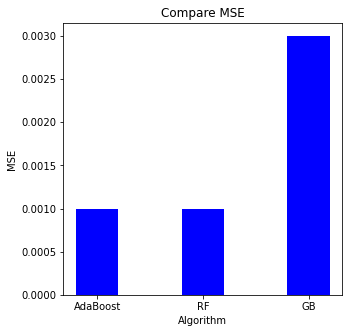

In [11]:
# creating the dataset
data = {'AdaBoost':0.001, 'RF':0.001, 'GB':0.003}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)
 
plt.xlabel("Algorithm")
plt.ylabel("MSE")
plt.title("Compare MSE")
plt.show()

<div style="direction:rtl; font-size:15px;"><b>נחשב שוב ממוצעים </b></div>


In [12]:
califorina_avg_2012 = statistics.mean([0.954708,0.939631,0.938454])
florida_avg_2012 = statistics.mean([0.940324,0.928572,0.908193])
south_dakota_avg_2012 = statistics.mean([0.937270,0.911814,0.916771])
wyoming_avg_2012 = statistics.mean([0.943909,0.923367,0.930772])

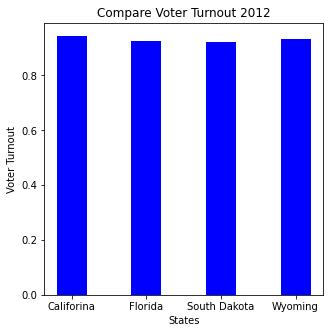

In [13]:
# creating the dataset
data = {'Califorina':califorina_avg_2012, 'Florida':florida_avg_2012, 'South Dakota':south_dakota_avg_2012,'Wyoming':wyoming_avg_2012}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)
 
plt.xlabel("States")
plt.ylabel("Voter Turnout")
plt.title("Compare Voter Turnout 2012")
plt.show()

<div style="direction:rtl; font-size:15px;"><b>נשווה בין התוצאות של 2010 ל-2012:</b></div>


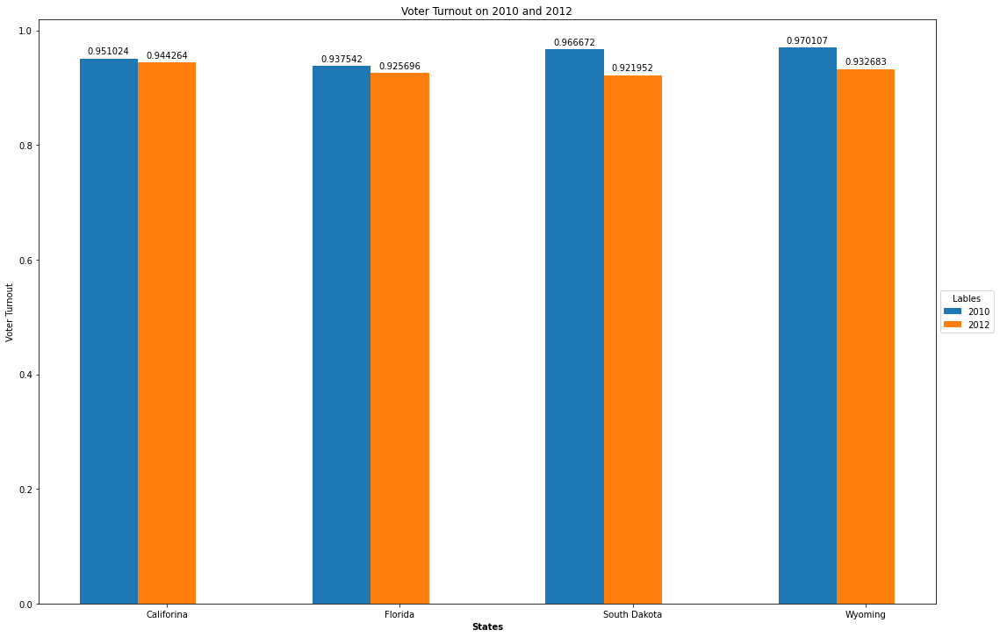

In [25]:
#Frequency of types of weather phenomena that occur each year


years=['2010','2012']
labels = ['Califorina','Florida','South Dakota','Wyoming']

x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars

r1 = np.arange(len(labels))
r2 = [x + width for x in r1]

fig, ax = plt.subplots(figsize=(15,10))
rects1 = ax.bar(r1, [califorina_avg_2010,florida_avg_2010,south_dakota_avg_2010,wyoming_avg_2010], width, label='2010')
rects2 = ax.bar(r2, [califorina_avg_2012,florida_avg_2012,south_dakota_avg_2012,wyoming_avg_2012], width, label='2012')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Voter Turnout')
ax.set_title('Voter Turnout on 2010 and 2012')

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)

fig.tight_layout()

ax.legend(years,
          title="Lables",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.xlabel('States', fontweight='bold')
plt.xticks([r + width for r in range(len(labels))], labels)

plt.show()

### Section C.4

<div style="direction:rtl; font-size:15px;">שמנו לב שהערכים כל 4 שנים עולים בערך ב0.5 , ולכן נשים ב-2010 את הערכים של 2008 פלוס 0.5,נשווה את התוצאות של המודל האחרון האחרון עם הערך בטבלה של 2012, כלומר מספר ההצבעות ב-house חלקי מספר ההצעות שהיו לנשיאות באותה שנה </div>

<div style="direction:rtl; font-size:15px;">ב-2012 יש לנו את השיעור ההצבעה המדויק שקבענו, ולכן נמצא את החמש עם ההפרשים הגדולים ביותר בין השיעור הצבעה בטבלה לבין השיעור שיצא ב- y_pred </div>

In [180]:
y_pred

array([0.95035587, 0.93928105, 0.93928105, 0.93062873, 0.95395024,
       0.90394563, 0.92274184, 0.93928105, 0.93169018, 0.93805642,
       0.92857215, 0.95035587, 0.91831792, 0.90445904, 0.94692868,
       0.93939082, 0.93928105, 0.93963112, 0.86405014, 0.93963112,
       0.87701109, 0.93169018, 0.83700981, 0.93805642, 0.95228808,
       0.92605181, 0.93963112, 0.92857215, 0.95395024, 0.95035587,
       0.93928105, 0.91181425, 0.95228808, 0.91181425, 0.93095759,
       0.93963112, 0.9403141 , 0.93776571, 0.95035587, 0.93062873,
       0.93169018, 0.9408433 , 0.93928105, 0.95035587, 0.93963112,
       0.94087661, 0.92336689, 0.94692868])

In [226]:
y_true = df_house_president[df_house_president['year']==2012]['Voter_Turnout'].tolist()
print(y_true)

[0.9999960064888, 0.9669561982154846, 1.0, 0.9550061821937561, 0.9998137354850769, 0.8553467392921448, 0.9711580872535706, 0.9118667840957642, 0.9713490009307861, 0.9730283617973328, 0.9649217128753662, 0.9738515019416809, 0.9115222692489624, 0.8866388201713562, 0.937589704990387, 0.9405122995376587, 0.9536768794059753, 0.9360212683677673, 0.9706265330314636, 0.9452270269393921, 0.9321672916412354, 0.9580536484718323, 0.9397869110107422, 0.9704702496528625, 0.9911000728607178, 0.956619381904602, 0.9618462920188904, 0.9704152941703796, 0.9687293171882629, 0.9817748665809631, 0.9587629437446594, 0.9288816452026367, 0.9934417009353638, 0.9178338646888733, 0.9676578640937805, 0.9546731114387512, 0.993304967880249, 0.9213922023773193, 0.9792278409004211, 0.9730854630470276, 0.9999370574951172, 0.9774573445320129, 0.9019593000411987, 0.9598352909088135, 0.9594292640686035, 0.972476601600647, 0.9331309199333191, 0.9590314030647278]


<div style="direction:rtl; font-size:15px;">נכניס ל-DF המראה לכל מדינה את האחוז הצבעה המשוער וההפרש בניהם <br>
לאחר מכן, נמיין לפי ההפרש ונבחר את ה-5 הגבוהים ביותר</div>

In [190]:
dic_true_pred = {}
for state,true,pred in zip(states_2012,y_true,y_pred):
    dic_true_pred[state] = [true,pred,abs(true-pred)]
    
df_pred = pd.DataFrame.from_dict(dic_true_pred, columns = ['y_true','y_pred','difference'],orient='index')
df_pred

,y_true,y_pred,difference
Wyoming,0.999996,0.950356,0.049640
Michigan,0.966956,0.939281,0.027675
Massachusetts,1.000000,0.939281,0.060719
Maryland,0.955006,0.930629,0.024377
Maine,0.999814,0.953950,0.045863
Louisiana,0.855347,0.903946,0.048599
Kentucky,0.971158,0.922742,0.048416
Kansas,0.911867,0.939281,0.027414
Iowa,0.971349,0.931690,0.039659
Indiana,0.973028,0.938056,0.034972


In [193]:
df_pred = df_pred.sort_values(by=['difference'])
df_pred.tail(5)

,y_true,y_pred,difference
Alabama,0.932167,0.877011,0.055156
Massachusetts,1.000000,0.939281,0.060719
New york,0.999937,0.931690,0.068247
Mississippi,0.939787,0.837010,0.102777
Arkansas,0.970627,0.864050,0.106576


<div style="direction:rtl; font-size:15px;">השיטה שבחרנו על מנת לשפר את הדיוק היא Bootstrapping , כלומר נכפיל את הרשומות של המדינות עם הדיוק הפחות טוב ונמצא לראות שיפור </div>

In [221]:
df_boost = df_house_president[df_house_president['year'].isin([2008])]
df_boost = df_boost[(df_boost['Mississippi']==1 ) | (df_boost['Arkansas']==1) | (df_boost['New york']==1) | (df_boost['Massachusetts']==1 )|(df_boost['Alabama']==1 )]

newdf = pd.DataFrame(np.repeat(df_boost.values, 10, axis=0)) # Each record will appear 10 times
newdf.columns = df_boost.columns

# We will now complete the number of missing records - the size of the original table
df_rest = df_house_president[df_house_president['year'].isin([2000,2004,2008,2010])].sample(142) 

df_boost = pd.concat([df_rest, newdf], axis=0)
df_boost

,year,runoff,special,writein,unofficial,fusion_ticket,district,Voter_Turnout,ELIMINATE THE PRIMARY,GRASSROOTS,...,Tennessee,Iowa,Maryland,Rhode island,Missouri,West virginia,Oklahoma,Vermont,California,North dakota
71,2004.0,0.0,0.0,0.0,0.0,0.0,0.0,0.986227,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
138,2008.0,0.0,0.0,1.0,0.0,0.0,0.0,0.917258,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
17,2000.0,0.0,0.0,8.0,0.0,0.0,8.0,0.951389,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39,2000.0,0.0,0.0,9.0,0.0,0.0,9.0,0.893168,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
220,2010.0,0.0,0.0,0.0,0.0,0.0,2.0,0.981238,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,2008.0,0.0,0.0,0.0,0.0,0.0,4.0,0.980527,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46,2008.0,0.0,0.0,0.0,0.0,0.0,4.0,0.980527,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47,2008.0,0.0,0.0,0.0,0.0,0.0,4.0,0.980527,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48,2008.0,0.0,0.0,0.0,0.0,0.0,4.0,0.980527,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [222]:
X_train = df_boost[df_boost['year'].isin([2000,2004,2008,2010])]

X_train.drop(['Voter_Turnout','runoff'], axis=1, inplace=True)

Y_train = df_boost[df_boost['year'].isin([2000,2004,2008,2010])]
Y_train= Y_train['Voter_Turnout']

X_test= df_house_president[df_house_president['year'].isin([2012])]
X_test.drop(['Voter_Turnout','runoff'], axis=1, inplace=True)

Y_test= df_house_president[df_house_president['year'].isin([2012])]['Voter_Turnout']

In [223]:
# adaboost
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# define model
ab = AdaBoostRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_estimators': [20, 50]
}

# define grid search
grid_search = GridSearchCV(estimator=ab, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate MSE
MSE = round(mean_squared_error(Y_test, y_pred), 3)

df = pd.DataFrame([MSE]).T
df = df.rename(index={0: 'AdaBoost Regressor'}, columns={0: 'MSE'})
df

,MSE
AdaBoost Regressor,0.001


In [224]:
dic_true_pred = {}
for state,true,pred in zip(states_2012,y_true,y_pred):
    dic_true_pred[state] = [true,pred,abs(true-pred)]
    
df_pred = pd.DataFrame.from_dict(dic_true_pred, columns = ['y_true','y_pred','difference'],orient='index')
df_pred

,y_true,y_pred,difference
Wyoming,0.999996,0.955819,0.044177
Michigan,0.966956,0.947217,0.019740
Massachusetts,1.000000,0.952090,0.047910
Maryland,0.955006,0.944918,0.010088
Maine,0.999814,0.955025,0.044789
Louisiana,0.855347,0.941034,0.085687
Kentucky,0.971158,0.919236,0.051922
Kansas,0.911867,0.952090,0.040223
Iowa,0.971349,0.952090,0.019259
Indiana,0.973028,0.950278,0.022750


In [225]:
df_pred = df_pred.sort_values(by=['difference'])
df_pred.tail(5)

,y_true,y_pred,difference
New jersey,0.901959,0.952090,0.050130
Kentucky,0.971158,0.919236,0.051922
Mississippi,0.939787,0.886099,0.053688
Arkansas,0.970627,0.900631,0.069996
Louisiana,0.855347,0.941034,0.085687


<div style="direction:rtl; font-size:15px;"><b>המודל שלנו שיפר את הדיוק של 3 מתוך 5 המדינות שהיו הנמוכות ביותר</div>

# Section D: 

In [6]:
df_section_D = df_house.copy(deep=True)
df_section_D['Class'] = None 

for row in df_section_D.itertuples(): 
    if(row[13] == 'DEMOCRAT'):
            df_section_D.at[row[0],'Class'] = 'D'
    if(row[13] == 'REPUBLICAN'):
            df_section_D.at[row[0],'Class'] = 'R' 

In [7]:
df_section_D = df_section_D[df_section_D['Class'].isin(['D','R'])]
df_section_D = df_section_D.groupby(by=['year','state','Class'],as_index=False).sum() # group by year,state and class
df_section_D

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket
0,1976,ALABAMA,D,7,441,287,28,0,0,667052,984181,0,141542317,0
1,1976,ALABAMA,R,4,252,164,13,0,0,314970,652072,0,80881324,0
2,1976,ALASKA,D,2,94,81,0,0,0,34194,118208,0,20220331,0
3,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0
4,1976,ARIZONA,D,16,344,244,10,0,0,355747,729002,0,80881324,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2272,2020,WEST VIRGINIA,R,162,165,168,6,0,0,514268,761385,0,60660993,0
2273,2020,WISCONSIN,D,440,280,200,36,0,0,1566671,3238051,0,161762648,0
2274,2020,WISCONSIN,R,440,280,200,36,0,0,1661399,3238051,0,161762648,0
2275,2020,WYOMING,D,56,83,68,0,0,0,66576,278503,0,20220331,0


In [8]:
df_section_D_classfier = pd.DataFrame(columns = df_section_D.columns)

per_state = 'ALABAMA' # the first state on table
max_vote = 0

for row in df_section_D.itertuples(): 
    list_val= []
    cur_state = row[2]
    for val in row:
        list_val.append(val)
    if(per_state != cur_state):
        df_section_D_classfier = df_section_D_classfier.append(max_series, ignore_index=True)
        max_vote = 0 
    if(row[10] > max_vote):
        max_vote = row[10]
        max_series = pd.Series(list_val[1:], index = df_section_D_classfier.columns)
    per_state = cur_state
df_section_D_classfier        

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket
0,1976,ALABAMA,D,7,441,287,28,0,0,667052,984181,0,141542317,0
1,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0
2,1976,ARIZONA,D,16,344,244,10,0,0,355747,729002,0,80881324,0
3,1976,ARKANSAS,D,15,213,126,7,0,0,260998,336390,0,60660993,0
4,1976,CALIFORNIA,D,258,3999,3053,946,0,0,4144324,7442501,0,869474233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,370968,0,20220331,0
1145,2020,VIRGINIA,D,510,540,400,57,0,0,2253974,4046162,0,202203310,0
1146,2020,WASHINGTON,D,583,1001,803,65,0,0,2340356,4284640,0,222423641,0
1147,2020,WEST VIRGINIA,R,162,165,168,6,0,0,514268,761385,0,60660993,0


In [9]:
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket
0,1976,ALABAMA,D,7,441,287,28,0,0,667052,984181,0,141542317,0
1,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0
2,1976,ARIZONA,D,16,344,244,10,0,0,355747,729002,0,80881324,0
3,1976,ARKANSAS,D,15,213,126,7,0,0,260998,336390,0,60660993,0
4,1976,CALIFORNIA,D,258,3999,3053,946,0,0,4144324,7442501,0,869474233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,370968,0,20220331,0
1145,2020,VIRGINIA,D,510,540,400,57,0,0,2253974,4046162,0,202203310,0
1146,2020,WASHINGTON,D,583,1001,803,65,0,0,2340356,4284640,0,222423641,0
1147,2020,WEST VIRGINIA,R,162,165,168,6,0,0,514268,761385,0,60660993,0


In [10]:
def return_value(x):
    if(list(set(x))[0] == 0):
        return 0
    else:
        return len(list(set(x)))

df_house_dis = df_house[['year','state','district']] 
df_house_group_with_number_of_district = df_house_dis.groupby(by=['year','state'],as_index=False).agg(lambda x: return_value(x))
df_house_group_with_number_of_district

,year,state,district
0,1976,ALABAMA,7
1,1976,ALASKA,0
2,1976,ARIZONA,4
3,1976,ARKANSAS,4
4,1976,CALIFORNIA,43
...,...,...,...
1146,2020,VIRGINIA,11
1147,2020,WASHINGTON,10
1148,2020,WEST VIRGINIA,3
1149,2020,WISCONSIN,8


In [11]:
# get total number of district per state

def return_value(x):
    if(list(set(x))[0] == 0):
        return 0
    else:
        return len(list(set(x)))

df_house_dis = df_house[['year','state','district']] 
df_house_group_with_number_of_district = df_house_dis.groupby(by=['year','state'],as_index=False).agg(lambda x: return_value(x))
states = list(df_house_group_with_number_of_district['state'][0:50])
district = list(df_house_group_with_number_of_district['district'][0:50])


zip_iterator = zip(states, district)
a_dictionary = dict(zip_iterator)
a_dictionary['DISTRICT OF COLUMBIA'] = 0 # Appears only in 2020

for row in df_section_D_classfier.itertuples():
    df_section_D_classfier.at[row[0],'district']= a_dictionary[row[2]]
    
df_section_D_classfier  

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,984181,0,141542317,0
1,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,729002,0,80881324,0
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,336390,0,60660993,0
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,7442501,0,869474233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,370968,0,20220331,0
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,4046162,0,202203310,0
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,4284640,0,222423641,0
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,761385,0,60660993,0


In [12]:
df_Economic['Date'] = pd.to_datetime(df_Economic['Date'])
for row in df_Economic.itertuples():
    df_Economic.at[row[0],'Date'] = int(row[1].year)

df_Economic = df_Economic.groupby(by=['Date'],as_index=False).max()
df_Economic.rename(columns = {'Date':'year'}, inplace = True)
df_Economic = df_Economic[df_Economic['year'].isin(set(df_section_D_classfier['year'].values))]
df_Economic

,year,Value
80,1976,1014.79
82,1978,907.74
84,1980,1000.17
86,1982,1070.55
88,1984,1286.64
90,1986,1955.57
92,1988,2183.50
94,1990,2999.75
96,1992,3413.21
98,1994,3978.36


In [13]:
df_section_D_classfier= pd.merge(left = df_section_D_classfier, right = df_Economic, how = 'left' , on = ['year'])
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket,Value
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,984181,0,141542317,0,1014.79
1,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0,1014.79
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,729002,0,80881324,0,1014.79
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,336390,0,60660993,0,1014.79
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,7442501,0,869474233,0,1014.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,370968,0,20220331,0,NaN
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,4046162,0,202203310,0,NaN
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,4284640,0,222423641,0,NaN
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,761385,0,60660993,0,NaN


<div style="direction:rtl; font-size:15px;">נוסיף פיצר של waterarea ו- landarea</div>

In [31]:
df_county_data.drop(['FIPS','Date'], axis=1, inplace=True)
df_county_data = df_county_data.groupby(by=['State'],as_index=False).sum()
df_county_data['State'] = df_county_data['State'].str.upper()
df_county_data.rename(columns = {'State':'state'}, inplace = True)
df_county_data.rename(columns = {'Population':'Population_1990'}, inplace = True)

In [32]:
df_section_D_classfier= pd.merge(left = df_section_D_classfier, right = df_county_data, how = 'left' , on = ['state'])
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,unofficial,version,fusion_ticket,Value,Land Area,Population_1990,Water Area
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,984181,0,141542317,0,1014.79,131443.1,4040587.0,4331.1
1,1976,ALASKA,R,2,94,81,0,0,0,83722,118208,0,20220331,0,1014.79,NaN,NaN,NaN
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,729002,0,80881324,0,1014.79,294333.6,3665228.0,942.7
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,336390,0,60660993,0,1014.79,134874.6,2350725.0,2769.4
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,7442501,0,869474233,0,1014.79,336237.8,27030912.0,7874.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,370968,0,20220331,0,NaN,23955.7,562758.0,945.7
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,4046162,0,202203310,0,NaN,96092.7,3738146.0,4271.9
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,4284640,0,222423641,0,NaN,163854.3,4793602.0,6402.1
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,761385,0,60660993,0,NaN,51186.6,1599249.0,144.4


<div style="direction:rtl; font-size:15px;">נוסיף פיצרים של אוכלוסייה,כמות עובדים, כמות מובטלים וcivilian_labor_force מטבלת country_complete בשנים 2010-2017 ובשאר השנים נעשה KNN</div>

In [33]:
df_country_complete['state'] = df_country_complete['state'].str.upper()
df_country_complete.rename(columns = {'State':'state'}, inplace = True)
df_country_complete = df_country_complete.groupby(by=['state'],as_index=False).sum() 

df_country_complete

,state,fips,pop2000,pop2010,pop2011,pop2012,pop2013,pop2014,pop2015,pop2016,...,poverty_under_18_2019,two_plus_races_2019,unemployment_rate_2019,uninsured_2019,uninsured_65_and_older_2019,uninsured_under_19_2019,uninsured_under_6_2019,veterans_2019,white_2019,white_not_hispanic_2019
0,ALABAMA,71489,4447100.0,4779736,4798649.0,4813946.0,4827660.0,4840037.0,4850858.0,4860545.0,...,998.2,112.0,444.6,671.0,24.9,215.0,212.2,544.9,4484.2,4344.0
1,ALASKA,62340,626932.0,710231,716786.0,725255.0,731136.0,731131.0,732278.0,735745.0,...,50.7,225.2,262.7,566.0,57.0,413.9,437.8,264.9,1465.0,1388.4
2,ARIZONA,60208,5130632.0,6392017,6465488.0,6544211.0,6616124.0,6706435.0,6802262.0,6908642.0,...,356.4,43.4,112.0,163.7,18.5,139.7,120.1,156.6,1121.7,753.2
3,ARKANSAS,380625,2673400.0,2915918,2938640.0,2949208.0,2956780.0,2964800.0,2975626.0,2988231.0,...,679.2,173.0,412.5,607.2,23.6,328.6,272.5,650.0,5849.1,5639.2
4,CALIFORNIA,351364,33871648.0,37253956,37672654.0,38019006.0,38347383.0,38701278.0,39032444.0,39296476.0,...,802.2,274.6,372.9,404.4,46.8,208.4,175.7,430.6,4252.8,3116.9
5,COLORADO,515983,4301261.0,5029196,5116411.0,5186330.0,5262556.0,5342311.0,5440445.0,5530105.0,...,213.6,169.7,283.3,594.3,42.3,416.8,357.9,597.7,5801.8,4758.1
6,CONNECTICUT,72064,3405565.0,3574097,3591927.0,3597705.0,3602470.0,3600188.0,3593862.0,3587685.0,...,93.3,25.8,41.4,35.3,3.7,19.3,17.3,56.2,655.6,601.0
7,DELAWARE,30009,783600.0,897934,907884.0,916868.0,925114.0,934805.0,944107.0,952698.0,...,56.5,9.0,14.5,18.7,2.3,12.7,12.4,29.8,212.4,194.0
8,DISTRICT OF COLUMBIA,11001,572059.0,601723,620336.0,635630.0,650114.0,660797.0,672736.0,684336.0,...,24.0,3.1,6.6,3.7,0.7,2.0,1.6,4.6,41.3,36.6
9,FLORIDA,808550,15982378.0,18801310,19097369.0,19341327.0,19584927.0,19897747.0,20268567.0,20656589.0,...,1071.3,157.0,380.4,861.0,58.4,514.7,386.1,720.3,5287.4,4514.9


In [34]:
years_pop = [2000,2010,2011,2012,2013,2014,2015,2016,2017]
years_emp_civilian = [2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017]

final_df = pd.DataFrame()

for year in years_pop:
    df_pop = df_country_complete[['state','pop'+str(year)]]
    df_pop.rename(columns = {'pop'+str(year):'pop'}, inplace = True)
    df_pop['year'] = year
    final_df = pd.concat([final_df, df_pop], axis=0)

df_section_D_classfier = pd.merge(left = df_section_D_classfier, right = final_df, how = 'left' , on = ['state','year'])
final_df = pd.DataFrame()

for year in years_emp_civilian:
    df_emp = df_country_complete[['state','employed_'+str(year)]]
    df_emp.rename(columns = {'employed_'+str(year):'employed'}, inplace = True)
    df_emp['year'] = year
    final_df = pd.concat([final_df, df_emp], axis=0)
    
df_section_D_classfier = pd.merge(left = df_section_D_classfier, right = final_df, how = 'left' , on = ['state','year'])
final_df = pd.DataFrame()
for year in years_emp_civilian:
    df_civilian = df_country_complete[['state','civilian_labor_force_'+str(year)]]
    df_civilian.rename(columns = {'civilian_labor_force_'+str(year):'civilian_labor_force'}, inplace = True)
    df_civilian['year'] = year
    final_df = pd.concat([final_df, df_civilian], axis=0)
    
df_section_D_classfier = pd.merge(left = df_section_D_classfier, right = final_df, how = 'left' , on = ['state','year'])
final_df = pd.DataFrame()

for year in years_emp_civilian:
    df_unemp = df_country_complete[['state','unemployed_'+str(year)]]
    df_unemp.rename(columns = {'unemployed_'+str(year):'unemployed'}, inplace = True)
    df_unemp['year'] = year
    final_df = pd.concat([final_df, df_unemp], axis=0)   
df_section_D_classfier = pd.merge(left = df_section_D_classfier, right = final_df, how = 'left' , on = ['state','year'])    
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,...,version,fusion_ticket,Value,Land Area,Population_1990,Water Area,pop,employed,civilian_labor_force,unemployed
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,...,141542317,0,1014.79,131443.1,4040587.0,4331.1,NaN,NaN,NaN,NaN
1,1976,ALASKA,R,2,94,81,0,0,0,83722,...,20220331,0,1014.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,...,80881324,0,1014.79,294333.6,3665228.0,942.7,NaN,NaN,NaN,NaN
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,...,60660993,0,1014.79,134874.6,2350725.0,2769.4,NaN,NaN,NaN,NaN
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,...,869474233,0,1014.79,336237.8,27030912.0,7874.3,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,...,20220331,0,NaN,23955.7,562758.0,945.7,NaN,NaN,NaN,NaN
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,...,202203310,0,NaN,96092.7,3738146.0,4271.9,NaN,NaN,NaN,NaN
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,...,222423641,0,NaN,163854.3,4793602.0,6402.1,NaN,NaN,NaN,NaN
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,...,60660993,0,NaN,51186.6,1599249.0,144.4,NaN,NaN,NaN,NaN


In [35]:
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,...,version,fusion_ticket,Value,Land Area,Population_1990,Water Area,pop,employed,civilian_labor_force,unemployed
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,...,141542317,0,1014.79,131443.1,4040587.0,4331.1,NaN,NaN,NaN,NaN
1,1976,ALASKA,R,2,94,81,0,0,0,83722,...,20220331,0,1014.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,...,80881324,0,1014.79,294333.6,3665228.0,942.7,NaN,NaN,NaN,NaN
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,...,60660993,0,1014.79,134874.6,2350725.0,2769.4,NaN,NaN,NaN,NaN
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,...,869474233,0,1014.79,336237.8,27030912.0,7874.3,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,...,20220331,0,NaN,23955.7,562758.0,945.7,NaN,NaN,NaN,NaN
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,...,202203310,0,NaN,96092.7,3738146.0,4271.9,NaN,NaN,NaN,NaN
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,...,222423641,0,NaN,163854.3,4793602.0,6402.1,NaN,NaN,NaN,NaN
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,...,60660993,0,NaN,51186.6,1599249.0,144.4,NaN,NaN,NaN,NaN


In [36]:
df_section_D_classfier= pd.merge(left = df_section_D_classfier, right = df_country_complete, how = 'left' , on = ['state'])
df_section_D_classfier

,year,state,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,...,poverty_under_18_2019,two_plus_races_2019,unemployment_rate_2019,uninsured_2019,uninsured_65_and_older_2019,uninsured_under_19_2019,uninsured_under_6_2019,veterans_2019,white_2019,white_not_hispanic_2019
0,1976,ALABAMA,D,7,441,287,7,0,0,667052,...,998.2,112.0,444.6,671.0,24.9,215.0,212.2,544.9,4484.2,4344.0
1,1976,ALASKA,R,2,94,81,0,0,0,83722,...,50.7,225.2,262.7,566.0,57.0,413.9,437.8,264.9,1465.0,1388.4
2,1976,ARIZONA,D,16,344,244,4,0,0,355747,...,356.4,43.4,112.0,163.7,18.5,139.7,120.1,156.6,1121.7,753.2
3,1976,ARKANSAS,D,15,213,126,4,0,0,260998,...,679.2,173.0,412.5,607.2,23.6,328.6,272.5,650.0,5849.1,5639.2
4,1976,CALIFORNIA,D,258,3999,3053,43,0,0,4144324,...,802.2,274.6,372.9,404.4,46.8,208.4,175.7,430.6,4252.8,3116.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,VERMONT,D,50,13,6,0,0,0,238827,...,67.2,28.3,48.5,58.6,3.0,21.7,19.2,111.8,1332.4,1314.4
1145,2020,VIRGINIA,D,510,540,400,10,0,0,2253974,...,905.1,379.8,641.2,1219.2,67.5,720.1,647.6,1321.3,9951.2,9471.3
1146,2020,WASHINGTON,D,583,1001,803,7,0,0,2340356,...,423.3,175.5,204.1,277.3,24.1,147.2,116.8,434.4,3244.5,2946.5
1147,2020,WEST VIRGINIA,R,162,165,168,4,0,0,514268,...,430.8,75.0,384.9,335.1,13.0,172.1,160.3,504.7,5229.8,5182.3


In [37]:
# one hot encoding for states

states = list(set(df_section_D_classfier['state']))
states_df_1 = pd.DataFrame(columns = states)

df_section_D_classfier = pd.concat([df_section_D_classfier, states_df_1], axis=1)

#fill the columns

for row in df_section_D_classfier.itertuples(): # put 1 on the current store column
    df_section_D_classfier.at[row[0],str(row[2])]=1
for state in states:
    df_section_D_classfier[state].replace(np.NaN, 0, inplace=True)
df_section_D_classfier.drop(['state'], axis=1, inplace=True)
df_section_D_classfier

,year,Class,state_fips,state_cen,state_ic,district,special,writein,candidatevotes,totalvotes,...,DISTRICT OF COLUMBIA,LOUISIANA,MICHIGAN,WASHINGTON,FLORIDA,CONNECTICUT,ARIZONA,IDAHO,VERMONT,HAWAII
0,1976,D,7,441,287,7,0,0,667052,984181,...,0,0,0,0,0,0,0,0,0,0
1,1976,R,2,94,81,0,0,0,83722,118208,...,0,0,0,0,0,0,0,0,0,0
2,1976,D,16,344,244,4,0,0,355747,729002,...,0,0,0,0,0,0,1,0,0,0
3,1976,D,15,213,126,4,0,0,260998,336390,...,0,0,0,0,0,0,0,0,0,0
4,1976,D,258,3999,3053,43,0,0,4144324,7442501,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020,D,50,13,6,0,0,0,238827,370968,...,0,0,0,0,0,0,0,0,1,0
1145,2020,D,510,540,400,10,0,0,2253974,4046162,...,0,0,0,0,0,0,0,0,0,0
1146,2020,D,583,1001,803,7,0,0,2340356,4284640,...,0,0,0,1,0,0,0,0,0,0
1147,2020,R,162,165,168,4,0,0,514268,761385,...,0,0,0,0,0,0,0,0,0,0


KNN for missing values

In [38]:
class_column = df_section_D_classfier[['Class']] #KNN get only numric value
df_section_D_classfier.drop(['Class'], axis=1, inplace=True)

imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_section_D_classfier)

# replace values in the dataset with new imputed values
df_section_D_classfier[df_section_D_classfier.columns] = imputed
df_section_D_classfier.isna().sum()

df_section_D_classfier['Class'] = class_column

df_section_D_classfier.drop(['state_fips','state_cen','state_ic','version'], axis=1, inplace=True)
df_section_D_classfier

,year,district,special,writein,candidatevotes,totalvotes,unofficial,fusion_ticket,Value,Land Area,...,LOUISIANA,MICHIGAN,WASHINGTON,FLORIDA,CONNECTICUT,ARIZONA,IDAHO,VERMONT,HAWAII,Class
0,1976.0,7.0,0.0,0.0,667052.0,984181.0,0.0,0.0,1014.790000,131443.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,D
1,1976.0,0.0,0.0,0.0,83722.0,118208.0,0.0,0.0,1014.790000,251500.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,R
2,1976.0,4.0,0.0,0.0,355747.0,729002.0,0.0,0.0,1014.790000,294333.6,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,D
3,1976.0,4.0,0.0,0.0,260998.0,336390.0,0.0,0.0,1014.790000,134874.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,D
4,1976.0,43.0,0.0,0.0,4144324.0,7442501.0,0.0,0.0,1014.790000,336237.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2020.0,0.0,0.0,0.0,238827.0,370968.0,0.0,0.0,14473.295261,23955.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,D
1145,2020.0,10.0,0.0,0.0,2253974.0,4046162.0,0.0,0.0,9960.087080,96092.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,D
1146,2020.0,7.0,0.0,0.0,2340356.0,4284640.0,0.0,0.0,8893.371226,163854.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,D
1147,2020.0,4.0,0.0,0.0,514268.0,761385.0,0.0,0.0,13699.396728,51186.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,R


In [26]:
years = [*range(1976, 2020, 2)] # 1976 - 2018

X_train = df_section_D_classfier[df_section_D_classfier['year'].isin(years)]
X_train.drop(['Class'], axis=1, inplace=True)

Y_train=df_section_D_classfier[df_section_D_classfier['year'].isin(years)]['Class']

X_test= df_section_D_classfier[df_section_D_classfier['year']==2020]
X_test.drop(['Class'], axis=1, inplace=True)

Y_test= df_section_D_classfier[df_section_D_classfier['year']==2020]['Class']


### SVM Classifier

SVM : https://www.kaggle.com/code/prashant111/svm-classifier-tutorial/notebook

In [28]:
from sklearn.svm import SVC

# import metrics to compute accuracy
from sklearn.metrics import accuracy_score

svc=SVC() #SVM with default hyperparameter


# fit classifier to training set
svc.fit(X_train,Y_train)


# make predictions on test set
y_pred=svc.predict(X_test)
# calculate accuracy
acc = round(accuracy_score(Y_test, y_pred), 3)
sensitivity, specificity = get_metrics(Y_test, y_pred)

# display metrics
df = pd.DataFrame([acc]).T
df = df.rename(index={0: 'SVM Classifier'}, columns={0: 'Accuracy'})
df

,Accuracy
SVM Classifier,0.7


Text(0.5, 0, 'Permutation Importance')

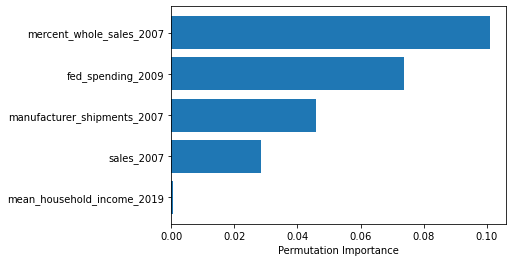

In [42]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(svc, X_train, Y_train)

feature_names = X_train.columns.tolist()
features = np.array(feature_names)

sorted_idx = perm_importance.importances_mean.argsort()[-5:]
plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

## Decision Tree Classifier

In [43]:
# define model
dt = DecisionTreeClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [2, 3],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [2, 8]
}

# define grid search
grid_search = GridSearchCV(estimator=dt, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate accuracy
acc = round(accuracy_score(Y_test, y_pred), 3)

# display metrics
df = pd.DataFrame([acc]).T
df = df.rename(index={0: 'Decision Tree Classifier'}, columns={0: 'Accuracy'})
df


,Accuracy
Decision Tree Classifier,0.84


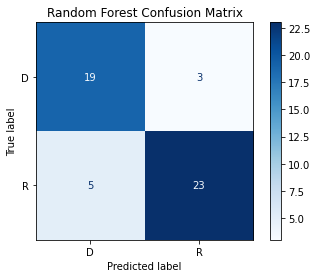

In [44]:
plot_confusion_matrix(best, X_test, Y_test, cmap='Blues')
plt.title("Random Forest Confusion Matrix")
plt.show()

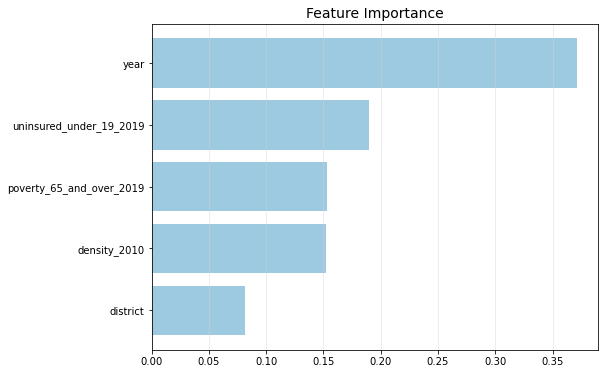

In [45]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance').tail(5)

# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

## Random Forest Classifier

In [46]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 4, 6],
    'n_estimators': [20, 50, 80]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate metrics
acc = round(accuracy_score(Y_test, y_pred), 3)

# display metrics
rf_df = pd.DataFrame([acc]).T
rf_df = rf_df.rename(index={0: 'Random Forest Classifier'}, columns={0: 'Accuracy'})
rf_df

,Accuracy
Random Forest Classifier,0.84


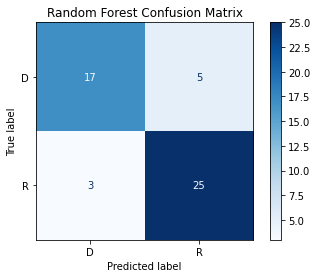

In [47]:
plot_confusion_matrix(best, X_test, Y_test, cmap='Blues')
plt.title("Random Forest Confusion Matrix")
plt.show()

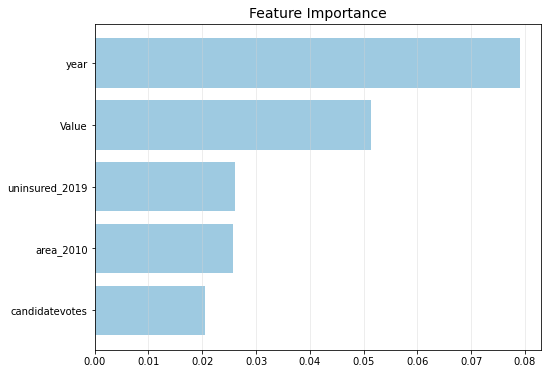

In [48]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance').tail(5)

# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#9ecae1')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

## Gradient Boosting

In [50]:
# define model
gb = GradientBoostingClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5, 2],
    'n_estimators': [50, 100, 120, 150, 180, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred = best.predict(X_test)

# calculate metrics
acc = round(accuracy_score(Y_test, y_pred), 3)

# display metrics
gb_df = pd.DataFrame([acc]).T
gb_df = gb_df.rename(index={0: 'Gradient Boosting Classifier'}, columns={0: 'Accuracy'})
gb_df


,Accuracy
Gradient Boosting Classifier,0.86


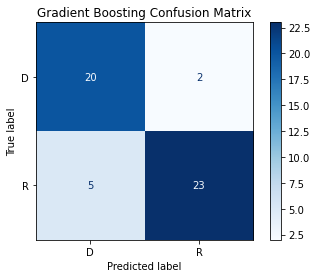

In [51]:
# plot confusion metrics
plot_confusion_matrix(best, X_test, Y_test, cmap='Blues')
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

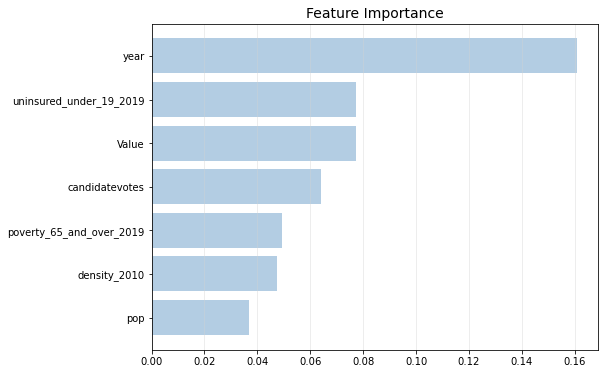

In [52]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_train, Y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance').tail(7)

# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [53]:
data = [["Gradient Boosting","0.86"],["Random Forest Regressor","0.84"],["Decision Tree Classifier","0.84"],["SVM Classifier","0.7"]]
pd.DataFrame(data, columns=["Type","Accuracy"])


,Type,Accuracy
0,Gradient Boosting,0.86
1,Random Forest Regressor,0.84
2,Decision Tree Classifier,0.84
3,SVM Classifier,0.7


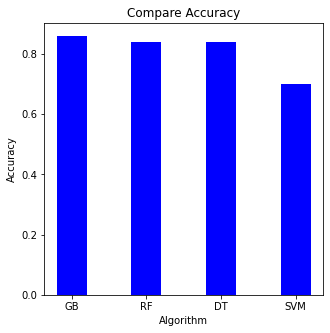

In [8]:
# creating the dataset
data = {'GB':0.86, 'RF':0.84, 'DT':0.84,'SVM':0.7}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='blue',
        width = 0.4)
 
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.title("Compare Accuracy")
plt.show()

# Section E (Bonus):

In [50]:
df_section_F = df_senate.copy(deep=True)
df_section_F

,year,state,state_po,state_fips,state_cen,state_ic,office,district,stage,special,candidate,party_detailed,writein,mode,candidatevotes,totalvotes,unofficial,version,party_simplified
0,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,SAM STEIGER,REPUBLICAN,False,total,321236,741210,False,20210114,REPUBLICAN
1,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,WM. MATHEWS FEIGHAN,INDEPENDENT,False,total,1565,741210,False,20210114,OTHER
2,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,DENNIS DECONCINI,DEMOCRAT,False,total,400334,741210,False,20210114,DEMOCRAT
3,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,ALLAN NORWITZ,LIBERTARIAN,False,total,7310,741210,False,20210114,LIBERTARIAN
4,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,BOB FIELD,INDEPENDENT,False,total,10765,741210,False,20210114,OTHER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3624,2020,WYOMING,WY,56,83,68,US SENATE,statewide,gen,False,UNDER VOTES,NaN,False,total,6401,278503,False,20210114,OTHER
3625,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,True,KELLY LOEFFLER,REPUBLICAN,False,total,2194848,4483294,True,20210114,REPUBLICAN
3626,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,True,RAPHAEL WARNOCK,DEMOCRAT,False,total,2288446,4483294,True,20210114,DEMOCRAT
3627,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,False,DAVID A. PERDUE,REPUBLICAN,False,total,2213979,4483241,True,20210114,REPUBLICAN


<div style="direction:rtl; font-size:15px;">נקבץ לפי מדינה ומפלגה, נחשב את כמות הקולות של המפלגה מסך כלל הקולות ולפי האחוזים (מתוך 100 מושבים) ניקח את מס' המושבים</div>

In [51]:
# change INDEPENDENT to DEMOCRAT
df_section_F['party_detailed'].replace('INDEPENDENT', 'DEMOCRAT', inplace=True)

#Leave only DEMOCRAT and REPUBLICAN

df_section_F = df_section_F[df_section_F['party_detailed'].isin(['REPUBLICAN', 'DEMOCRAT'])]
df_section_F

,year,state,state_po,state_fips,state_cen,state_ic,office,district,stage,special,candidate,party_detailed,writein,mode,candidatevotes,totalvotes,unofficial,version,party_simplified
0,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,SAM STEIGER,REPUBLICAN,False,total,321236,741210,False,20210114,REPUBLICAN
1,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,WM. MATHEWS FEIGHAN,DEMOCRAT,False,total,1565,741210,False,20210114,OTHER
2,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,DENNIS DECONCINI,DEMOCRAT,False,total,400334,741210,False,20210114,DEMOCRAT
4,1976,ARIZONA,AZ,4,86,61,US SENATE,statewide,gen,False,BOB FIELD,DEMOCRAT,False,total,10765,741210,False,20210114,OTHER
6,1976,CALIFORNIA,CA,6,93,71,US SENATE,statewide,gen,False,S. I. (SAM) HAYAKAWA,REPUBLICAN,False,total,3748973,7470586,False,20210114,REPUBLICAN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3618,2020,WEST VIRGINIA,WV,54,55,56,US SENATE,statewide,gen,False,PAULA JEAN SWEARENGIN,DEMOCRAT,False,total,210309,778918,False,20210114,DEMOCRAT
3625,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,True,KELLY LOEFFLER,REPUBLICAN,False,total,2194848,4483294,True,20210114,REPUBLICAN
3626,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,True,RAPHAEL WARNOCK,DEMOCRAT,False,total,2288446,4483294,True,20210114,DEMOCRAT
3627,2021,GEORGIA,GA,13,58,44,US SENATE,statewide,runoff,False,DAVID A. PERDUE,REPUBLICAN,False,total,2213979,4483241,True,20210114,REPUBLICAN


In [52]:
# get total vote
df_totalvote = df_section_F.groupby(by=['year','state'],as_index=False).max()
df_totalvote = df_totalvote.groupby(by=['year',],as_index=False).sum()
df_totalvote = df_totalvote[['year','totalvotes']]
df_totalvote

,year,totalvotes
0,1976,59173007
1,1978,28534476
2,1980,59169658
3,1982,51589995
4,1984,45462266
5,1986,48511005
6,1988,67424244
7,1990,35027371
8,1992,71599872
9,1994,58287911


In [53]:
df_section_F = df_section_F.groupby(by=['year','state','party_detailed'],as_index=False).sum()
df_section_F.drop(['totalvotes'], axis=1, inplace=True) #drop the sum of total vote and add the new from df_totalvotes

df_section_F= pd.merge(left = df_section_F, right = df_totalvote, how = 'inner' , on = ['year'])

#############
df_section_F.at[1513,'totalvotes']=8966535
df_section_F.at[1514,'totalvotes']=8966535
########
df_section_F

,year,state,party_detailed,state_fips,state_cen,state_ic,special,writein,candidatevotes,unofficial,version,totalvotes
0,1976,ARIZONA,DEMOCRAT,12,258,183,0,0,412664,0,60630342,59173007
1,1976,ARIZONA,REPUBLICAN,4,86,61,0,0,321236,0,20210114,59173007
2,1976,CALIFORNIA,DEMOCRAT,12,186,142,0,0,3534491,0,40420228,59173007
3,1976,CALIFORNIA,REPUBLICAN,6,93,71,0,0,3748973,0,20210114,59173007
4,1976,CONNECTICUT,DEMOCRAT,9,16,1,0,0,561018,0,20210114,59173007
...,...,...,...,...,...,...,...,...,...,...,...,...
1510,2020,VIRGINIA,REPUBLICAN,51,54,40,0,0,1934199,0,20210114,84252546
1511,2020,WEST VIRGINIA,DEMOCRAT,54,55,56,0,0,210309,0,20210114,84252546
1512,2020,WEST VIRGINIA,REPUBLICAN,54,55,56,0,0,547454,0,20210114,84252546
1513,2021,GEORGIA,DEMOCRAT,26,116,88,1,0,4557708,2,40420228,8966535


In [54]:
# Updates the number of seats relative to the total quantity

for row in df_section_F.itertuples(): # put 1 on the current store column
    df_section_F.at[row[0],'num_seats']= round((row[9]/row[12])*100)
df_section_F

,year,state,party_detailed,state_fips,state_cen,state_ic,special,writein,candidatevotes,unofficial,version,totalvotes,num_seats
0,1976,ARIZONA,DEMOCRAT,12,258,183,0,0,412664,0,60630342,59173007,1.0
1,1976,ARIZONA,REPUBLICAN,4,86,61,0,0,321236,0,20210114,59173007,1.0
2,1976,CALIFORNIA,DEMOCRAT,12,186,142,0,0,3534491,0,40420228,59173007,6.0
3,1976,CALIFORNIA,REPUBLICAN,6,93,71,0,0,3748973,0,20210114,59173007,6.0
4,1976,CONNECTICUT,DEMOCRAT,9,16,1,0,0,561018,0,20210114,59173007,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1510,2020,VIRGINIA,REPUBLICAN,51,54,40,0,0,1934199,0,20210114,84252546,2.0
1511,2020,WEST VIRGINIA,DEMOCRAT,54,55,56,0,0,210309,0,20210114,84252546,0.0
1512,2020,WEST VIRGINIA,REPUBLICAN,54,55,56,0,0,547454,0,20210114,84252546,1.0
1513,2021,GEORGIA,DEMOCRAT,26,116,88,1,0,4557708,2,40420228,8966535,51.0


<div style="direction:rtl; font-size:15px;"> נזרוק עמודות לא רלוונטיות</div>

In [55]:
df_section_F.drop(['state_fips','state_cen','candidatevotes','version'], axis=1, inplace=True) #drop the sum of total vote and add the new from df_totalvotes

<div style="direction:rtl; font-size:15px;">נוסיף שורות של המדינות שאנחנו רוצים לחזות ב-2022</div>

In [56]:
states = ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Connecticut', 
'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 
'Kentucky', 'Louisiana', 'Maryland', 'Missouri', 'Nevada', 'New Hampshire', 
'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma ', 
'Oregon', 'Pennsylvania', 'South Carolina', 'South Dakota', 'Utah', 
'Vermont', 'Washington', 'Wisconsin'] 

states = [state.upper() for state in states] # to upper case
df_section_2022 = pd.DataFrame()
for state in states:
    demo_series = pd.Series([2022,state,'DEMOCRAT',None,None,None,None,None,None], index = df_section_F.columns)
    rep_series = pd.Series([2022,state,'REPUBLICAN',None,None,None,None,None,None], index = df_section_F.columns)
    df_section_2022 = df_section_2022.append(demo_series, ignore_index=True)
    df_section_2022 = df_section_2022.append(rep_series, ignore_index=True)

df_section_F = pd.concat([df_section_F, df_section_2022], axis=0)
df_section_F

,year,state,party_detailed,state_ic,special,writein,unofficial,totalvotes,num_seats
0,1976.0,ARIZONA,DEMOCRAT,183,0,0,0,59173007,1.0
1,1976.0,ARIZONA,REPUBLICAN,61,0,0,0,59173007,1.0
2,1976.0,CALIFORNIA,DEMOCRAT,142,0,0,0,59173007,6.0
3,1976.0,CALIFORNIA,REPUBLICAN,71,0,0,0,59173007,6.0
4,1976.0,CONNECTICUT,DEMOCRAT,1,0,0,0,59173007,1.0
...,...,...,...,...,...,...,...,...,...
61,2022.0,VERMONT,REPUBLICAN,None,None,None,None,None,NaN
62,2022.0,WASHINGTON,DEMOCRAT,None,None,None,None,None,NaN
63,2022.0,WASHINGTON,REPUBLICAN,None,None,None,None,None,NaN
64,2022.0,WISCONSIN,DEMOCRAT,None,None,None,None,None,NaN


In [57]:
# Add LandArea, Pop1990 and WaterArea features of all selected states
df_county_data['State'] = df_county_data['State'].str.upper()
df_county_select_state = df_county_data[df_county_data['State'].isin(states)]
df_county_select_state = df_county_select_state.groupby(by=['State'],as_index=False).sum()
df_county_select_state.rename(columns = {'State':'state'}, inplace = True)
df_county_select_state.drop(['FIPS','Date'], axis=1, inplace=True)

df_section_F = df_section_F[df_section_F['state'].isin(states)] #only selected state 
df_section_F= pd.merge(left = df_section_F, right = df_county_select_state, how = 'inner' , on = ['state'])
df_section_F

,year,state,party_detailed,state_ic,special,writein,unofficial,totalvotes,num_seats,Land Area,Population,Water Area
0,1976.0,ARIZONA,DEMOCRAT,183,0,0,0,59173007,1.0,294333.6,3665228,942.7
1,1976.0,ARIZONA,REPUBLICAN,61,0,0,0,59173007,1.0,294333.6,3665228,942.7
2,1980.0,ARIZONA,DEMOCRAT,61,0,0,0,59169658,1.0,294333.6,3665228,942.7
3,1980.0,ARIZONA,REPUBLICAN,61,0,0,0,59169658,1.0,294333.6,3665228,942.7
4,1982.0,ARIZONA,DEMOCRAT,61,0,0,0,51589995,1.0,294333.6,3665228,942.7
...,...,...,...,...,...,...,...,...,...,...,...,...
942,2016.0,SOUTH DAKOTA,REPUBLICAN,37,0,0,0,96866505,0.0,179927.5,589915,1592.1
943,2020.0,SOUTH DAKOTA,DEMOCRAT,37,0,0,1,84252546,0.0,179927.5,589915,1592.1
944,2020.0,SOUTH DAKOTA,REPUBLICAN,37,0,0,1,84252546,0.0,179927.5,589915,1592.1
945,2022.0,SOUTH DAKOTA,DEMOCRAT,None,None,None,None,None,NaN,179927.5,589915,1592.1


נקבץ לפי שנה ומחלקה, נשים לב שמספר המושבים הוא בהתאם למדינות שנגשות לבחירות הקרובות! 
מס' המושבים האמיתי הכולל את שאר המדינות הוא יותר גבוה 

In [58]:
df_section_F = df_section_F.groupby(by=['year','party_detailed'],as_index=False).sum()
df_section_F

,year,party_detailed,num_seats,Land Area,Population,Water Area
0,1976.0,DEMOCRAT,30.0,2397110.9,110970288,109865.5
1,1976.0,REPUBLICAN,28.0,2397110.9,110970288,109865.5
2,1978.0,DEMOCRAT,19.0,1893982.5,46321543,36649.5
3,1978.0,REPUBLICAN,17.0,1786522.1,42594352,31148.2
4,1980.0,DEMOCRAT,49.0,4118717.8,156725822,145245.9
5,1980.0,REPUBLICAN,42.0,4118717.8,156725822,145245.9
6,1982.0,DEMOCRAT,33.0,2397110.9,110970288,109865.5
7,1982.0,REPUBLICAN,30.0,2397110.9,110970288,109865.5
8,1984.0,DEMOCRAT,20.0,1893982.5,46321543,36649.5
9,1984.0,REPUBLICAN,19.0,1683615.5,38909056,29428.9


<div style="direction:rtl; font-size:15px;">נוסיף פיצרים הדומים לסעיף D אך הפעם נוסיף לפי שנים  </div>

In [59]:
# Add value economic feature (1976-2016)

df_section_F= pd.merge(left = df_section_F, right = df_Economic, how = 'left' , on = ['year'])
df_section_F

,year,party_detailed,num_seats,Land Area,Population,Water Area,Value
0,1976.0,DEMOCRAT,30.0,2397110.9,110970288,109865.5,1014.79
1,1976.0,REPUBLICAN,28.0,2397110.9,110970288,109865.5,1014.79
2,1978.0,DEMOCRAT,19.0,1893982.5,46321543,36649.5,907.74
3,1978.0,REPUBLICAN,17.0,1786522.1,42594352,31148.2,907.74
4,1980.0,DEMOCRAT,49.0,4118717.8,156725822,145245.9,1000.17
5,1980.0,REPUBLICAN,42.0,4118717.8,156725822,145245.9,1000.17
6,1982.0,DEMOCRAT,33.0,2397110.9,110970288,109865.5,1070.55
7,1982.0,REPUBLICAN,30.0,2397110.9,110970288,109865.5,1070.55
8,1984.0,DEMOCRAT,20.0,1893982.5,46321543,36649.5,1286.64
9,1984.0,REPUBLICAN,19.0,1683615.5,38909056,29428.9,1286.64


<div style="direction:rtl; font-size:15px;">נוסיף פיצרים של אוכלוסייה,כמות עובדים, כמות מובטלים וcivilian_labor_force מטבלת country_complete בשנים 2010-2017 ובשאר השנים נעשה KNN</div>

In [60]:
years_pop = [2000,2010,2011,2012,2013,2014,2015,2016,2017]
years_emp_civilian = [2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017]

final_df = pd.DataFrame()

for year in years_pop:
    df_pop = df_country_complete[['state','pop'+str(year)]]
    df_pop.rename(columns = {'pop'+str(year):'pop'}, inplace = True)
    df_pop['year'] = year
    final_df = pd.concat([final_df, df_pop], axis=0)

final_df = final_df.groupby(by=['year'],as_index=False).sum()
df_section_F = pd.merge(left = df_section_F, right = final_df, how = 'left' , on = ['year'])

final_df = pd.DataFrame()

for year in years_emp_civilian:
    df_emp = df_country_complete[['state','employed_'+str(year)]]
    df_emp.rename(columns = {'employed_'+str(year):'employed'}, inplace = True)
    df_emp['year'] = year
    final_df = pd.concat([final_df, df_emp], axis=0)
    
final_df = final_df.groupby(by=['year'],as_index=False).sum()
df_section_F = pd.merge(left = df_section_F, right = final_df, how = 'left' , on = ['year'])
final_df = pd.DataFrame()

for year in years_emp_civilian:
    df_civilian = df_country_complete[['state','civilian_labor_force_'+str(year)]]
    df_civilian.rename(columns = {'civilian_labor_force_'+str(year):'civilian_labor_force'}, inplace = True)
    df_civilian['year'] = year
    final_df = pd.concat([final_df, df_civilian], axis=0)
    
final_df = final_df.groupby(by=['year'],as_index=False).sum()
df_section_F = pd.merge(left = df_section_F, right = final_df, how = 'left' , on = ['year'])
final_df = pd.DataFrame()

for year in years_emp_civilian:
    df_unemp = df_country_complete[['state','unemployed_'+str(year)]]
    df_unemp.rename(columns = {'unemployed_'+str(year):'unemployed'}, inplace = True)
    df_unemp['year'] = year
    final_df = pd.concat([final_df, df_unemp], axis=0)
    
final_df = final_df.groupby(by=['year'],as_index=False).sum()
df_section_F = pd.merge(left = df_section_F, right = final_df, how = 'left' , on = ['year']) 
df_section_F.rename(columns = {'Population':'Population1990'}, inplace = True)
df_section_F

,year,party_detailed,num_seats,Land Area,Population1990,Water Area,Value,pop,employed,civilian_labor_force,unemployed
0,1976.0,DEMOCRAT,30.0,2397110.9,110970288,109865.5,1014.79,NaN,NaN,NaN,NaN
1,1976.0,REPUBLICAN,28.0,2397110.9,110970288,109865.5,1014.79,NaN,NaN,NaN,NaN
2,1978.0,DEMOCRAT,19.0,1893982.5,46321543,36649.5,907.74,NaN,NaN,NaN,NaN
3,1978.0,REPUBLICAN,17.0,1786522.1,42594352,31148.2,907.74,NaN,NaN,NaN,NaN
4,1980.0,DEMOCRAT,49.0,4118717.8,156725822,145245.9,1000.17,NaN,NaN,NaN,NaN
5,1980.0,REPUBLICAN,42.0,4118717.8,156725822,145245.9,1000.17,NaN,NaN,NaN,NaN
6,1982.0,DEMOCRAT,33.0,2397110.9,110970288,109865.5,1070.55,NaN,NaN,NaN,NaN
7,1982.0,REPUBLICAN,30.0,2397110.9,110970288,109865.5,1070.55,NaN,NaN,NaN,NaN
8,1984.0,DEMOCRAT,20.0,1893982.5,46321543,36649.5,1286.64,NaN,NaN,NaN,NaN
9,1984.0,REPUBLICAN,19.0,1683615.5,38909056,29428.9,1286.64,NaN,NaN,NaN,NaN


In [61]:
# one hot encoding for party

partys = ['DEMOCRAT','REPUBLICAN']
party_df = pd.DataFrame(columns = partys)

df_section_F = pd.concat([df_section_F, party_df], axis=1)

#fill the columns

for row in df_section_F.itertuples(): # put 1 on the current store column
    df_section_F.at[row[0],str(row[2])]=1
for party in partys:
    df_section_F[party].replace(np.NaN, 0, inplace=True)
df_section_F.drop(['party_detailed'], axis=1, inplace=True)
df_section_F

,year,num_seats,Land Area,Population1990,Water Area,Value,pop,employed,civilian_labor_force,unemployed,DEMOCRAT,REPUBLICAN
0,1976.0,30.0,2397110.9,110970288,109865.5,1014.79,NaN,NaN,NaN,NaN,1,0
1,1976.0,28.0,2397110.9,110970288,109865.5,1014.79,NaN,NaN,NaN,NaN,0,1
2,1978.0,19.0,1893982.5,46321543,36649.5,907.74,NaN,NaN,NaN,NaN,1,0
3,1978.0,17.0,1786522.1,42594352,31148.2,907.74,NaN,NaN,NaN,NaN,0,1
4,1980.0,49.0,4118717.8,156725822,145245.9,1000.17,NaN,NaN,NaN,NaN,1,0
5,1980.0,42.0,4118717.8,156725822,145245.9,1000.17,NaN,NaN,NaN,NaN,0,1
6,1982.0,33.0,2397110.9,110970288,109865.5,1070.55,NaN,NaN,NaN,NaN,1,0
7,1982.0,30.0,2397110.9,110970288,109865.5,1070.55,NaN,NaN,NaN,NaN,0,1
8,1984.0,20.0,1893982.5,46321543,36649.5,1286.64,NaN,NaN,NaN,NaN,1,0
9,1984.0,19.0,1683615.5,38909056,29428.9,1286.64,NaN,NaN,NaN,NaN,0,1


In [62]:
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(df_section_F)

# replace values in the dataset with new imputed values
df_section_F[df_section_F.columns] = imputed
df_section_F.isna().sum()
df_section_F

,year,num_seats,Land Area,Population1990,Water Area,Value,pop,employed,civilian_labor_force,unemployed,DEMOCRAT,REPUBLICAN
0,1976.0,30.0,2397110.9,110970288.0,109865.5,1014.790000,3.017917e+08,1.425969e+08,1.551137e+08,1.251673e+07,1.0,0.0
1,1976.0,28.0,2397110.9,110970288.0,109865.5,1014.790000,3.017917e+08,1.425969e+08,1.551137e+08,1.251673e+07,0.0,1.0
2,1978.0,19.0,1893982.5,46321543.0,36649.5,907.740000,3.185960e+08,1.455185e+08,1.547199e+08,9.201374e+06,1.0,0.0
3,1978.0,17.0,1786522.1,42594352.0,31148.2,907.740000,3.182843e+08,1.460917e+08,1.555660e+08,9.474352e+06,0.0,1.0
4,1980.0,49.0,4118717.8,156725822.0,145245.9,1000.170000,3.136257e+08,1.434361e+08,1.558558e+08,1.241963e+07,1.0,0.0
5,1980.0,42.0,4118717.8,156725822.0,145245.9,1000.170000,3.136257e+08,1.434361e+08,1.558558e+08,1.241963e+07,0.0,1.0
6,1982.0,33.0,2397110.9,110970288.0,109865.5,1070.550000,3.017864e+08,1.425969e+08,1.551137e+08,1.251674e+07,1.0,0.0
7,1982.0,30.0,2397110.9,110970288.0,109865.5,1070.550000,3.017864e+08,1.425969e+08,1.551137e+08,1.251674e+07,0.0,1.0
8,1984.0,20.0,1893982.5,46321543.0,36649.5,1286.640000,3.185964e+08,1.455149e+08,1.547146e+08,9.199728e+06,1.0,0.0
9,1984.0,19.0,1683615.5,38909056.0,29428.9,1286.640000,3.162898e+08,1.457052e+08,1.550729e+08,9.367702e+06,0.0,1.0


<div style="direction:rtl; font-size:15px;"> נפצל למסד נתונים של דמוקרטים ורפובליקנים ונבצע חיזוי לכל אחד</div>

In [64]:
df_REPUBLICAN = df_section_F[df_section_F['REPUBLICAN']==1]
df_DEMOCRAT = df_section_F[df_section_F['DEMOCRAT']==1]

In [65]:
df_REPUBLICAN

,year,num_seats,Land Area,Population1990,Water Area,Value,pop,employed,civilian_labor_force,unemployed,DEMOCRAT,REPUBLICAN
1,1976.0,28.0,2397110.9,110970288.0,109865.5,1014.790000,3.017917e+08,1.425969e+08,1.551137e+08,1.251673e+07,0.0,1.0
3,1978.0,17.0,1786522.1,42594352.0,31148.2,907.740000,3.182843e+08,1.460917e+08,1.555660e+08,9.474352e+06,0.0,1.0
5,1980.0,42.0,4118717.8,156725822.0,145245.9,1000.170000,3.136257e+08,1.434361e+08,1.558558e+08,1.241963e+07,0.0,1.0
7,1982.0,30.0,2397110.9,110970288.0,109865.5,1070.550000,3.017864e+08,1.425969e+08,1.551137e+08,1.251674e+07,0.0,1.0
9,1984.0,19.0,1683615.5,38909056.0,29428.9,1286.640000,3.162898e+08,1.457052e+08,1.550729e+08,9.367702e+06,0.0,1.0
11,1986.0,43.0,4291093.4,157291831.0,146515.0,1955.570000,3.142246e+08,1.438119e+08,1.560059e+08,1.219404e+07,0.0,1.0
13,1988.0,32.0,2397110.9,110970288.0,109865.5,2183.500000,3.016671e+08,1.425968e+08,1.551136e+08,1.251682e+07,0.0,1.0
15,1990.0,18.0,1594541.7,39309570.0,25864.6,2999.750000,3.164898e+08,1.457225e+08,1.550913e+08,9.368896e+06,0.0,1.0
17,1992.0,49.0,4183633.0,153564640.0,141013.7,3413.210000,3.126992e+08,1.431792e+08,1.557463e+08,1.256707e+07,0.0,1.0
19,1994.0,32.0,2397110.9,110970288.0,109865.5,3978.360000,3.014005e+08,1.425965e+08,1.551134e+08,1.251695e+07,0.0,1.0


In [66]:
df_DEMOCRAT

,year,num_seats,Land Area,Population1990,Water Area,Value,pop,employed,civilian_labor_force,unemployed,DEMOCRAT,REPUBLICAN
0,1976.0,30.0,2397110.9,110970288.0,109865.5,1014.790000,3.017917e+08,1.425969e+08,1.551137e+08,1.251673e+07,1.0,0.0
2,1978.0,19.0,1893982.5,46321543.0,36649.5,907.740000,3.185960e+08,1.455185e+08,1.547199e+08,9.201374e+06,1.0,0.0
4,1980.0,49.0,4118717.8,156725822.0,145245.9,1000.170000,3.136257e+08,1.434361e+08,1.558558e+08,1.241963e+07,1.0,0.0
6,1982.0,33.0,2397110.9,110970288.0,109865.5,1070.550000,3.017864e+08,1.425969e+08,1.551137e+08,1.251674e+07,1.0,0.0
8,1984.0,20.0,1893982.5,46321543.0,36649.5,1286.640000,3.185964e+08,1.455149e+08,1.547146e+08,9.199728e+06,1.0,0.0
10,1986.0,45.0,4291093.4,157291831.0,146515.0,1955.570000,3.142246e+08,1.438119e+08,1.560059e+08,1.219404e+07,1.0,0.0
12,1988.0,29.0,2397110.9,110970288.0,109865.5,2183.500000,3.016671e+08,1.425968e+08,1.551136e+08,1.251682e+07,1.0,0.0
14,1990.0,23.0,1986886.3,51865702.0,38072.5,2999.750000,3.146137e+08,1.455423e+08,1.548827e+08,9.340409e+06,1.0,0.0
16,1992.0,55.0,4291093.4,157291831.0,146515.0,3413.210000,3.139961e+08,1.436280e+08,1.559333e+08,1.230531e+07,1.0,0.0
18,1994.0,27.0,2397110.9,110970288.0,109865.5,3978.360000,3.014005e+08,1.425965e+08,1.551134e+08,1.251695e+07,1.0,0.0


<div style="direction:rtl; font-size:15px;"> נבצע חיזוי לכל מפלגה </div>

<div style="direction:rtl; font-size:15px;"> רפובליקנים: </div>

In [97]:
years = [*range(1976, 2022, 1)] # 1976 - 2021

X_train = df_REPUBLICAN[df_REPUBLICAN['year'].isin(years)]
X_train.drop(['num_seats'], axis=1, inplace=True)

Y_train = df_REPUBLICAN[df_REPUBLICAN['year'].isin(years)]
Y_train= Y_train['num_seats']

X_test= df_REPUBLICAN[df_REPUBLICAN['year'].isin([2022])]
X_test.drop(['num_seats'], axis=1, inplace=True)

Y_test= df_REPUBLICAN[df_REPUBLICAN['year'].isin([2022])]['num_seats']

In [98]:
# adaboost
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# define model
ab = AdaBoostRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_estimators': [20, 50]
}

# define grid search
grid_search = GridSearchCV(estimator=ab, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred_rep = best.predict(X_test)
y_pred_rep

array([44.])

<div style="direction:rtl; font-size:15px;"> דמוקרטים: </div>

In [99]:
years = [*range(1976, 2022, 1)] # 1976 - 2021

X_train = df_DEMOCRAT[df_DEMOCRAT['year'].isin(years)]
X_train.drop(['num_seats'], axis=1, inplace=True)

Y_train = df_DEMOCRAT[df_DEMOCRAT['year'].isin(years)]
Y_train= Y_train['num_seats']

X_test= df_DEMOCRAT[df_DEMOCRAT['year'].isin([2022])]
X_test.drop(['num_seats'], axis=1, inplace=True)

Y_test= df_DEMOCRAT[df_DEMOCRAT['year'].isin([2022])]['num_seats']

In [100]:
# adaboost
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# define model
ab = AdaBoostRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_estimators': [20, 50]
}

# define grid search
grid_search = GridSearchCV(estimator=ab, param_grid=parameters_grid, cv=10)

# fit estimator
grid_search.fit(X_train, Y_train)

# get best estimator
best = grid_search.best_estimator_

# predict
y_pred_demo = best.predict(X_test)
y_pred_demo

array([48.])

In [102]:
data = [["Democrat","48"],["Republican","44"],["Other","8"]]
pd.DataFrame(data, columns=["Party","Seats"])

,Party,Seats
0,Democrat,48
1,Republican,44
2,Other,8


### נשים לב שהתוצאות שלנו מציגות אך ורק את המדינות שהתבקשנו להציג (33 מתוך 50) ולכן מספר המושבים יצא נמוך יחסית (מתוך ה-100) ולכן כאשר שאר המדינות יגשו לבחירות המספר של המושבים ישאף ל-100